# MI Classification with DiffE

In [ ]:
!pip install ema-pytorch
!pip install pytorch_metric_learning
!pip install mne #1.9.0

In [ ]:
import os
import sys

!git clone https://github.com/diffe2023/Diff-E.git
sys.path.append('/content/Diff-E')

# !git clone https://github.com/vlawhern/arl-eegmodels.git
# sys.path.append('/content/arl-eegmodels')

# !ls /content/arl-eegmodels


fatal: destination path 'Diff-E' already exists and is not an empty directory.


In [ ]:
import math
from einops import reduce
from functools import partial
import random
import argparse
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from ema_pytorch import EMA
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    f1_score,
    roc_auc_score,
    precision_score,
    recall_score,
    top_k_accuracy_score,
)

# from EEGModels import EEGNet

In [ ]:
import mne
# import copy
import gdown
import scipy.io
# import pandas as pd
# import seaborn as sn

# from torchsummary import summary
# from torch.autograd import Variable
# from torch.utils.data import DataLoader, TensorDataset, random_split

# from sklearn.feature_selection import mutual_info_classif
# from sklearn.metrics import confusion_matrix, accuracy_score

In [ ]:
!pip install --upgrade numpy==1.24.4

In [ ]:
# Uncomment this if you want to use Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!mkdir -p /content/drive/MyDrive/project/dataset/MI/cleaned_data/
!mkdir -p /content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session
!mkdir -p /content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session

#load and preprocess data


In [ ]:
raw = mne.io.read_raw_gdf('/content/drive/MyDrive/project/dataset/MI/raw_data/A01T.gdf', preload=False)
print("All unique event labels:")
print(np.unique(raw.annotations.description))


Extracting EDF parameters from /content/drive/MyDrive/project/dataset/MI/raw_data/A01T.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG, EOG-left, EOG-central, EOG-right
Creating raw.info structure...


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


All unique event labels:
['1023' '1072' '276' '277' '32766' '768' '769' '770' '771' '772']


In [ ]:
descs = raw.annotations.description
# Take the first 300 annotations and print the count of each type
from collections import Counter
print("[DEBUG] Distribution of annotation types in the first 300 entries:", Counter(descs[:300]))

# Display the contents of annotations 289–300 (to check for non-cue types)
print("[DEBUG] Annotations 289–300:", list(descs[288:300]))

[DEBUG] Distribution of annotation types in the first 300 entries: Counter({'768': 141, '772': 36, '771': 36, '770': 35, '769': 34, '1023': 9, '32766': 6, '276': 1, '277': 1, '1072': 1})
[DEBUG] Annotations 289–300: ['768', '769', '768', '772', '768', '771', '768', '771', '768', '771', '768', '771']


In [ ]:
raw2 = mne.io.read_raw_gdf('/content/drive/MyDrive/project/dataset/MI/raw_data/A01E.gdf', preload=False)
print("All unique event labels:")
print(np.unique(raw2.annotations.description))

Extracting EDF parameters from /content/drive/MyDrive/project/dataset/MI/raw_data/A01E.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
EEG-Fz, EEG, EEG, EEG, EEG, EEG, EEG, EEG-C3, EEG, EEG-Cz, EEG, EEG-C4, EEG, EEG, EEG, EEG, EEG, EEG, EEG, EEG-Pz, EEG, EEG, EOG-left, EOG-central, EOG-right
Creating raw.info structure...
All unique event labels:
['1023' '1072' '276' '277' '32766' '768' '783']


/usr/lib/python3.11/contextlib.py:144: RuntimeWarning: Channel names are not unique, found duplicates for: {'EEG'}. Applying running numbers for duplicates.
  next(self.gen)


In [ ]:
descs2 = raw2.annotations.description
# Take the first 300 annotations and print the count of each type
from collections import Counter
print("[DEBUG] Distribution of annotation types in the first 300 entries:", Counter(descs2[:300]))

# Display the contents of annotations 289–300 (to check for non-cue types)
print("[DEBUG] Annotations 289–300:", list(descs2[288:300]))

[DEBUG] Distribution of annotation types in the first 300 entries: Counter({'768': 143, '783': 142, '32766': 6, '1023': 6, '276': 1, '277': 1, '1072': 1})
[DEBUG] Annotations 289–300: ['783', '768', '783', '768', '783', '768', '783', '768', '783', '768', '783', '768']


In [ ]:
# raw_data_folder = '/content/drive/MyDrive/project/dataset/MI/raw_data/'
# cleaned_data_folder = '/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/'
# files = os.listdir(raw_data_folder)

# # Selecting files with suffix 'T.gdf'
# filtered_files = [file for file in files if file.endswith('T.gdf')]

# raw_list = []

# # Iterating through filtered files
# for file in filtered_files:
#     file_path = os.path.join(raw_data_folder, file)

#     # Reading raw data
#     raw = mne.io.read_raw_gdf(file_path, eog=['EOG-left', 'EOG-central', 'EOG-right'], preload=True)

#     # Droping EOG channels
#     raw.drop_channels(['EOG-left', 'EOG-central', 'EOG-right'])

#     # High Pass Filtering 4-40 Hz
#     raw.filter(l_freq=4, h_freq=40, method='iir')

#     # Notch filter for Removal of Line Voltage
#     raw.notch_filter(freqs=50)

#     # Saving the modified raw data to a file with .fif suffix
#     new_file_path = os.path.join(cleaned_data_folder, file[:-4] + '.fif')
#     raw.save(new_file_path, overwrite=True)
#     # Appending data to the list
#     raw_list.append(raw)

# final_raw = mne.concatenate_raws(raw_list)
# new_file_path = os.path.join(cleaned_data_folder, 'First_Session_Subjects.fif')
# final_raw.save(new_file_path, overwrite=True)

FIRST SESSIONS

In [ ]:
# # Replace this with your actual shareable link
# shareable_link = 'https://drive.google.com/file/d/11Ke2Xta1kv2xu2Mybuu_X51zJYjQ-VFo/view?usp=drive_link'

# # Extract file ID from the shareable link
# file_id = shareable_link.split('/d/')[1].split('/view')[0]

# # Create the direct download link
# download_url = f'https://drive.google.com/uc?id={file_id}&export=download'

# # Specify the output file path
# output_file = 'true_labels.zip'

# # Download the file
# gdown.download(download_url, output_file, quiet=False)

In [ ]:
#%%capturey
# !unzip /content/true_labels.zip -d /content/drive/MyDrive/project/dataset/MI/second_session_labels/

In [ ]:
label_dir = "/content/drive/MyDrive/project/dataset/MI/second_session_labels"

for fname in sorted(os.listdir(label_dir)):
    if fname.endswith(".mat"):
        fpath = os.path.join(label_dir, fname)
        mat = scipy.io.loadmat(fpath)

        label_key = None
        for k in mat:
            if not k.startswith("__") and isinstance(mat[k], np.ndarray):
                print(f"{fname} - Possible key: {k} → shape: {mat[k].shape}")
                if "label" in k.lower():
                    label_key = k

        if label_key is None:
            print(f"{fname}: No valid label key found.\n")
            continue

        labels = mat[label_key].squeeze()
        print(f"📄 {fname}")
        print(f"→ key: {label_key}")
        print(f"→ shape: {labels.shape}, dtype: {labels.dtype}")
        print(f"→ unique labels: {np.unique(labels)}")
        print(f"→ first 10 labels: {labels[:10]}\n")


A01E.mat - Possible key: classlabel → shape: (288, 1)
📄 A01E.mat
→ key: classlabel
→ shape: (288,), dtype: uint8
→ unique labels: [1 2 3 4]
→ first 10 labels: [1 2 2 1 2 1 2 3 2 4]

A01T.mat - Possible key: classlabel → shape: (288, 1)
📄 A01T.mat
→ key: classlabel
→ shape: (288,), dtype: uint8
→ unique labels: [1 2 3 4]
→ first 10 labels: [4 3 2 1 1 2 3 4 2 3]

A02E.mat - Possible key: classlabel → shape: (288, 1)
📄 A02E.mat
→ key: classlabel
→ shape: (288,), dtype: uint8
→ unique labels: [1 2 3 4]
→ first 10 labels: [1 2 2 1 2 1 2 3 2 4]

A02T.mat - Possible key: classlabel → shape: (288, 1)
📄 A02T.mat
→ key: classlabel
→ shape: (288,), dtype: uint8
→ unique labels: [1 2 3 4]
→ first 10 labels: [1 2 2 1 2 1 2 3 2 4]

A03E.mat - Possible key: classlabel → shape: (288, 1)
📄 A03E.mat
→ key: classlabel
→ shape: (288,), dtype: uint8
→ unique labels: [1 2 3 4]
→ first 10 labels: [1 2 2 1 2 1 2 3 2 4]

A03T.mat - Possible key: classlabel → shape: (288, 1)
📄 A03T.mat
→ key: classlabel
→ shape

SECOND SESSION

In [ ]:
# raw_data_folder = '/content/drive/MyDrive/project/dataset/MI/raw_data/'
# cleaned_data_folder = '/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/'
# mat_folder = '/content/drive/MyDrive/project/dataset/MI/second_session_labels/'

# # Selecting files with suffix 'E.mat'
# mat_files = os.listdir(mat_folder)
# filtered_math_labels = [file for file in mat_files if file.endswith('E.mat')]

# # Selecting files with suffix 'E.gdf'
# files = os.listdir(raw_data_folder)
# filtered_files = [file for file in files if file.endswith('E.gdf')]

# raw_list = []
# second_session_labels = np.array([])
# # Iterating through filtered files
# for file in filtered_files:
#     file_path = os.path.join(raw_data_folder, file)

#     # Reading raw data
#     raw = mne.io.read_raw_gdf(file_path, eog=['EOG-left', 'EOG-central', 'EOG-right'], preload=True)
#     # Droping EOG channels
#     raw.drop_channels(['EOG-left', 'EOG-central', 'EOG-right'])

#     # High Pass Filtering 4-40 Hz
#     raw.filter(l_freq=4, h_freq=40, method='iir')

#     # Saving the modified raw data to a file with .fif suffix
#     new_file_path = os.path.join(cleaned_data_folder, file[:-4] + '.fif')
#     raw.save(new_file_path, overwrite=True)
#     # Appending data to t he list
#     raw_list.append(raw)

#     # Mat files for the labels
#     mat_file_name = file.replace('.gdf', '.mat')
#     mat_file_path = os.path.join(mat_folder, mat_file_name)
#     print(f"data:{file}, label:{mat_file_name}")

#     if os.path.exists(mat_file_path):
#         mat_data = scipy.io.loadmat(mat_file_path)
#         class_labels = mat_data.get('classlabel', [])

#         # Check if 'classlabel' key exists and is not empty
#         if class_labels.size > 0:
#              # Convert to a NumPy array and flatten
#             class_labels_array = np.array(class_labels, dtype=int).flatten()
#             # Concatenate with the existing test_labels array
#             second_session_labels = np.concatenate((second_session_labels, class_labels_array))
#         else:
#             print(f"Warning: 'classlabel' not found or empty in {mat_file_name}.")
#     else:
#         print(f"Warning: {mat_file_name} not found.")

# final_raw = mne.concatenate_raws(raw_list)
# new_file_path = os.path.join(cleaned_data_folder, 'Second_Session_Subjects.fif')
# final_raw.save(new_file_path, overwrite=True)

In [ ]:
# mne.sys_info()

In [ ]:
def check_mi_completeness(root_dir, subject_ids=list(range(1, 10))):
    sessions = ["first_session", "second_session"]
    mi_keys = ['769', '770', '771', '772']
    incomplete_subjects = []

    for sid in subject_ids:
        for sess in sessions:
            prefix = "T" if sess == "first_session" else "E"
            fname = f"A{sid:02d}{prefix}.fif"
            fpath = os.path.join(root_dir, sess, fname)

            if not os.path.exists(fpath):
                print(f"[ERROR] Missing file: {fpath}")
                continue

            try:
                raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)
                _, event_id = mne.events_from_annotations(raw, verbose=False)

                # Extract events and event_id from annotations
                events, event_id = mne.events_from_annotations(raw, verbose=False)
                from collections import Counter
                label_counts = Counter(events[:, 2])

                # Reverse the event_id dictionary to get {event_code: label}
                inverse_event_id = {v: k for k, v in event_id.items()}

                # Identify event codes that appear exactly 72 times (expected count for MI classes)
                mi_event_ids = [eid for eid, count in label_counts.items() if count == 72]
                motor_event_id = {inverse_event_id[eid]: eid for eid in mi_event_ids if eid in inverse_event_id}

                print(f"[DEBUG] Subject {sid} {sess} candidate MI labels: {list(motor_event_id.keys())}")

                if len(motor_event_id) < 4:
                    print(f"[✗] Subject {sid} {sess}: MI types missing → found {list(motor_event_id.keys())}")
                    incomplete_subjects.append((sid, sess))
                    continue


                # Filter events to include only MI-related ones
                events, _ = mne.events_from_annotations(raw, verbose=False)
                mi_events = np.array([e for e in events if e[2] in motor_event_id.values()])
                counts = {k: 0 for k in mi_keys}
                for e in mi_events:
                    for k, v in motor_event_id.items():
                        if e[2] == v:
                            counts[k] += 1

                if any(v != 72 for v in counts.values()):
                    print(f"[✗] Subject {sid} {sess}: Incomplete trials → {counts}")
                    incomplete_subjects.append((sid, sess))
                else:
                    print(f"[✓] Subject {sid} {sess}: All MI classes OK")

            except Exception as e:
                print(f"[ERROR] Subject {sid} {sess}: Failed to load – {e}")
                incomplete_subjects.append((sid, sess))

    return incomplete_subjects

root_dir = "/content/drive/MyDrive/project/dataset/MI/cleaned_data"
incomplete = check_mi_completeness(root_dir)

print("\n=== Summary: Incomplete Sessions ===")
for sid, sess in incomplete:
    print(f"Subject {sid} - {sess}")


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A01T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 1 first_session candidate MI labels: ['772', '771', '770', '769']
[✓] Subject 1 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A01E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 1 second_session candidate MI labels: []
[✗] Subject 1 second_session: MI types missing → found []


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A02T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 2 first_session candidate MI labels: ['769', '770', '771', '772']
[✓] Subject 2 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A02E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 2 second_session candidate MI labels: []
[✗] Subject 2 second_session: MI types missing → found []


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A03T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 3 first_session candidate MI labels: ['769', '770', '771', '772']
[✓] Subject 3 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A03E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 3 second_session candidate MI labels: []
[✗] Subject 3 second_session: MI types missing → found []


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A04T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 4 first_session candidate MI labels: ['772', '769', '770', '771']
[✓] Subject 4 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A04E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 4 second_session candidate MI labels: []
[✗] Subject 4 second_session: MI types missing → found []


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A05T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 5 first_session candidate MI labels: ['769', '770', '771', '772']
[✓] Subject 5 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A05E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 5 second_session candidate MI labels: []
[✗] Subject 5 second_session: MI types missing → found []


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A06T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 6 first_session candidate MI labels: ['772', '770', '769', '771']
[✓] Subject 6 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A06E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 6 second_session candidate MI labels: []
[✗] Subject 6 second_session: MI types missing → found []


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A07T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 7 first_session candidate MI labels: ['769', '770', '771', '772']
[✓] Subject 7 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A07E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 7 second_session candidate MI labels: []
[✗] Subject 7 second_session: MI types missing → found []


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A08T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 8 first_session candidate MI labels: ['769', '770', '771', '772']
[✓] Subject 8 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A08E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 8 second_session candidate MI labels: []
[✗] Subject 8 second_session: MI types missing → found []


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A09T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 9 first_session candidate MI labels: ['772', '770', '769', '771']
[✓] Subject 9 first_session: All MI classes OK


<ipython-input-18-6ec144fe559d>:17: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A09E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=False, verbose=False)


[DEBUG] Subject 9 second_session candidate MI labels: []
[✗] Subject 9 second_session: MI types missing → found []

=== Summary: Incomplete Sessions ===
Subject 1 - second_session
Subject 2 - second_session
Subject 3 - second_session
Subject 4 - second_session
Subject 5 - second_session
Subject 6 - second_session
Subject 7 - second_session
Subject 8 - second_session
Subject 9 - second_session


#split data

We retain the original SSVEP data preprocessing procedures, including:

    - Bandpass filtering using a Butterworth filter (4–40 Hz), applied with zero-phase (forward and reverse) IIR method.
    - Notch filtering at 50 Hz to remove power line noise.
    - Manual removal of EOG channels: ['EOG-left', 'EOG-central', 'EOG-right'].
    - Epoch segmentation: trial-wise slicing into 0–4 s windows based on event annotations.
    - Sampling rate standardized to 250 Hz (original dataset).
Unlike the original setup where models are trained separately for each subject, we train a single model jointly across all subjects by concatenating all subjects' data.

In [ ]:
# Define a function to perform z-score normalization on the data
def zscore_norm(data):
    # Calculate the mean and standard deviation for each channel in each batch
    mean = torch.mean(data, dim=(1, 2))
    std = torch.std(data, dim=(1, 2))

    # Subtract the mean from each channel in each batch and divide by the standard deviation
    norm_data = (data - mean[:, None, None]) / std[:, None, None]

    return norm_data


# Define a function to perform min-max normalization on the data
def minmax_norm(data):
    # Calculate the minimum and maximum values for each channel and sequence in the batch
    min_vals = torch.min(data, dim=-1)[0]
    max_vals = torch.max(data, dim=-1)[0]

    # Scale the data to the range [0, 1]
    norm_data = (data - min_vals.unsqueeze(-1)) / (
        max_vals.unsqueeze(-1) - min_vals.unsqueeze(-1)
    )

    return norm_data

In [ ]:
class EEGDataset(Dataset):
    """Characterizes an EEG dataset for PyTorch (used for t-SNE plotting)."""

    def __init__(self, X, Y, subject_ids=None, transform=None):
        self.X = X                            # (n_epochs, n_channels, n_times)
        self.Y = Y                            # (n_epochs,)
        self.subject_ids = (subject_ids
                            if subject_ids is not None
                            else torch.zeros(len(Y), dtype=torch.long))
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, index):
        x   = self.X[index]
        y   = self.Y[index]
        sid = self.subject_ids[index]
        if self.transform:
            x = self.transform(x)
        return x.squeeze(), y, sid


def split_by_class_and_run(Y, seed=44, trials_per_run=12, n_classes=4, n_runs=6, train_count=8, val_count=2, test_count=2, num_sessions=2):
    random.seed(seed)
    train_idx, val_idx, test_idx = [], [], []
    for cls in range(n_classes):
        cls_indices = (Y == cls).nonzero(as_tuple=True)[0]
        expected_count = trials_per_run * n_runs * num_sessions
        assert len(cls_indices) == expected_count, \
            f"Class {cls} expected {expected_count}, got {len(cls_indices)}"

        for run in range(n_runs):
            run_trials = cls_indices[run * trials_per_run: (run + 1) * trials_per_run].tolist()
            random.shuffle(run_trials)
            train_idx.extend(run_trials[:train_count])
            val_idx.extend(run_trials[train_count:train_count + val_count])
            test_idx.extend(run_trials[train_count + val_count:train_count + val_count + test_count])
    return train_idx, val_idx, test_idx


def load_data_by_session(root_dir, subject_id, session_folders, label_dir=label_dir):
    """
    root_dir/
      first_session/
        A01T_cleaned.fif … A09T_cleaned.fif
      second_session/
        A01E_cleaned.fif … A09E_cleaned.fif

    session_folders: list of folder names, e.g. ["first_session"] or ["second_session"]
    """
    X_list, Y_list = [], []

    for folder in session_folders:
        prefix = "T" if folder == "first_session" else "E"
        fname = f"A{subject_id:02d}{prefix}.fif"
        fpath = os.path.join(root_dir, folder, fname)
        raw = mne.io.read_raw_fif(fpath, preload=True, verbose=False)

        if folder == "first_session":
            # MI cue as '769'~'772'，mapping as 0–3 labels
            events, event_id = mne.events_from_annotations(raw, verbose=False)
            motor_keys = ['769', '770', '771', '772']
            motor_event_id = {k: v for k, v in event_id.items() if k in motor_keys}
            if len(motor_event_id) < 4:
                raise ValueError(f"{fname} missing MI cues. Found: {event_id}")
            events = np.array([e for e in events if e[2] in motor_event_id.values()])
            label_map = {
                motor_event_id['769']: 0,
                motor_event_id['770']: 1,
                motor_event_id['771']: 2,
                motor_event_id['772']: 3,
            }
            labels = np.array([label_map[e[-1]] for e in events])

        elif folder == "second_session":
            assert label_dir is not None, "Must provide label_dir for second_session"
            mat_path = os.path.join(label_dir, f"A{subject_id:02d}E.mat")
            mat = scipy.io.loadmat(mat_path)
            label_key = [k for k in mat if "label" in k.lower() and not k.startswith("__")][0]
            labels = mat[label_key].squeeze()
            assert labels.shape[0] == 288, f"{mat_path} expected 288 labels, got {labels.shape}"
            labels = labels - 1  # Convert from 1–4 to 0–3

            # cue '783' as unknown MI tasks
            mask = raw.annotations.description == '783'
            assert mask.sum() == 288, f"Expected 288 '783' cue annotations, got {mask.sum()}"

            cue_annot = raw.annotations[mask]
            raw.set_annotations(cue_annot)
            events, _ = mne.events_from_annotations(raw, verbose=False)

        epochs = mne.Epochs(
            raw, events,
            tmin=0.0,
            tmax=4.0,
            baseline=None,
            preload=True,
            verbose=False,
            event_repeated="drop"
        )
        data = epochs.get_data()
        X_list.append(torch.from_numpy(data).float())
        Y_list.append(torch.from_numpy(labels).long())

    X = torch.cat(X_list, dim=0)
    Y = torch.cat(Y_list, dim=0)
    return X, Y

def load_split_dataset(root_dir, num_seen, seed=43):
    random.seed(seed)

    all_subjects   = list(range(1, 10))
    seen_subjects  = random.sample(all_subjects, num_seen)
    unseen_subjects = [sid for sid in all_subjects if sid not in seen_subjects]

    split_cfg = {
        "train_val_test1": [(sid, ["first_session", "second_session"]) for sid in seen_subjects],
        "test2":     [(sid, ["first_session", "second_session"]) for sid in unseen_subjects],
    }

    print(f"[Split] Seen (train/val/test1): {seen_subjects}")
    print(f"[Split] Unseen (test2):        {unseen_subjects}")

    loaders = {}
    subject_id_dict = {}

    # load train_val data first
    X_train_all, Y_train_all, train_subject_ids = [], [], []
    X_val_all, Y_val_all, val_subject_ids = [], [], []
    X_test1_all, Y_test1_all, test1_subject_ids = [], [], []

    for sid in seen_subjects:
        for session in ["first_session", "second_session"]:
            X, Y = load_data_by_session(root_dir, sid, [session])
            train_idx, val_idx, test_idx = split_by_class_and_run(
                Y, seed=seed, num_sessions=1
            )

            X_train_all.append(X[train_idx])
            Y_train_all.append(Y[train_idx])
            train_subject_ids.extend([sid] * len(train_idx))

            X_val_all.append(X[val_idx])
            Y_val_all.append(Y[val_idx])
            val_subject_ids.extend([sid] * len(val_idx))

            X_test1_all.append(X[test_idx])
            Y_test1_all.append(Y[test_idx])
            test1_subject_ids.extend([sid] * len(test_idx))

    loaders["train"] = DataLoader(
        EEGDataset(torch.cat(X_train_all), torch.cat(Y_train_all),
                   subject_ids=torch.tensor(train_subject_ids, dtype=torch.long)),
        batch_size=32, shuffle=True)
    subject_id_dict["train"] = torch.tensor(train_subject_ids, dtype=torch.long)

    loaders["val"] = DataLoader(
        EEGDataset(torch.cat(X_val_all), torch.cat(Y_val_all),
                   subject_ids=torch.tensor(val_subject_ids, dtype=torch.long)),
        batch_size=32, shuffle=False)
    subject_id_dict["val"] = torch.tensor(val_subject_ids, dtype=torch.long)

    loaders["test1"] = DataLoader(
        EEGDataset(torch.cat(X_test1_all), torch.cat(Y_test1_all),
                   subject_ids=torch.tensor(test1_subject_ids, dtype=torch.long)),
        batch_size=32, shuffle=False)
    subject_id_dict["test1"] = torch.tensor(test1_subject_ids, dtype=torch.long)

    # Process unseen subjects: use all trials
    X_all, Y_all, subject_ids = [], [], []
    for sid in unseen_subjects:
        X, Y = load_data_by_session(root_dir, sid, ["first_session", "second_session"])
        X_all.append(X)
        Y_all.append(Y)
        subject_ids.extend([sid] * len(Y))

    loaders["test2"] = DataLoader(
        EEGDataset(torch.cat(X_all), torch.cat(Y_all),
                   subject_ids=torch.tensor(subject_ids, dtype=torch.long)),
        batch_size=32, shuffle=False)
    subject_id_dict["test2"] = torch.tensor(subject_ids, dtype=torch.long)

    for split in ["train", "val", "test1", "test2"]:
        loaders[f"{split}_subjects"] = subject_id_dict[split]

    return loaders

In [ ]:
seed = 44
random.seed(seed)
torch.manual_seed(seed)
print("Random Seed: ", seed)

Random Seed:  44


In [ ]:
subject_chars_dir='/content/drive/MyDrive/project/dataset/MI/cleaned_data' # Where to store all character data
subject_ids = list(range(1, 10)) #35 samples + 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 32
batch_size2 = 260
seed = 44 #same as the training
shuffle = True

# load all subjects' data
loaders = load_split_dataset(subject_chars_dir, num_seen=7, seed=seed)
train_loader = loaders["train"]
val_loader = loaders["val"]
test1_loader = loaders["test1"]
test2_loader = loaders["test2"]
train_iter = iter(train_loader)


[Split] Seen (train/val/test1): [7, 2, 8, 4, 9, 3, 1]
[Split] Unseen (test2):        [5, 6]


<ipython-input-20-ea9149bc6e98>:58: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/first_session/A07T.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=True, verbose=False)
<ipython-input-20-ea9149bc6e98>:58: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/second_session/A07E.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fpath, preload=True, verbose=False)
<ipython-input-20-ea9149bc6e98>:58: RuntimeWarning: This filename (/content/drive/MyDrive/project/dataset/MI/cleaned_data/fir

In [ ]:
with torch.no_grad():
    x, y, sid = next(train_iter)
    unique_sids = torch.unique(sid)
    print("Unique subject IDs in this batch:", unique_sids.tolist())
    print("Count:", len(unique_sids))


Unique subject IDs in this batch: [1, 2, 3, 4, 7, 8, 9]
Count: 7


In [ ]:
print(len(train_loader.dataset), len(val_loader.dataset), len(test1_loader.dataset), len(test2_loader.dataset))

for x, y,_ in train_loader:
    print("X shape:", x.shape)
    print("Y shape:", y.shape)
    break  # the first batch

2688 672 672 1152
X shape: torch.Size([32, 22, 1001])
Y shape: torch.Size([32])


all: 5184

train: 7 seen subjects × 2 session × 8 trials for each task × 4 tasks × 6 runs = 2688(51.85%)

val: 7 × 2 × 2 × 4 × 6 = 672(12.96%)

test1: 7 × 2 × 2 × 4 × 6 = 672(12.96%)

test2: 2 unseen × 2 session × 12 trials for each task × 4 tasks × 6 runs = 1152(22.22%)

### Updated Grouping Table

| **Group Name** | **Subject Range**       | **Sessions Used**   | **Purpose**                                                     | **Sampling Strategy**                                                                                                                                   |
|-----------------|-------------------------|----------------------|-----------------------------------------------------------------|---------------------------------------------------------------------------------------------------------------------------------------------------------|
| train           | 7 seen subjects         | sessions [0–1]       | Train on all sessions of seen subjects, after leaving 2 trials per class/run/session to val + test1 | Remaining (12 - 2 - 2) = 8 trials × 4 tasks × 6 runs × 2 sessions = **384 trials/subject**; total 7 subjects → 2688 trials |
| val             | 7 seen subjects         | sessions [0–1]       | Validation: 2 trials per class/run/session                      | 2 trials × 4 tasks × 6 runs × 2 sessions = **96 trials/subject**; total 7 subjects → 672 trials                                                        |
| test1           | 7 seen subjects         | sessions [0–1]       | Test on seen subjects using another 2 trials per class/run/session | 2 trials × 4 tasks × 6 runs × 2 sessions = **96 trials/subject**; total 7 subjects → 672 trials                                                        |
| test2           | 2 unseen subjects       | sessions [0–1]       | Test on completely unseen subjects (all trials)                 | All trials: 12 trials × 4 tasks × 6 runs × 2 sessions = **576 trials/subject**; total 2 subjects → 1152 trials                                         |

---

### Sample Count Summary

| **Split** | **Per Subject Trials** | **#Subjects** | **Total Trials** |
|-----------|-------------------------|---------------|------------------|
| train     | 384                     | 7             | 2688             |
| val       | 96                      | 7             | 672              |
| test1     | 96                      | 7             | 672              |
| test2     | 1152                    | 2             | 1152             |
| **Total** |                         |               | **5184**         |


### Dataset Details for Local Normalization (per-subject)

| **Dataset** | **Subject Type** | **Sessions Used**   | **Samples per Subject**                                                  | **#Subjects** | **Mean/Std Computed From (per subject)**                                                              |
|-------------|------------------|---------------------|-------------------------------------------------------------------------|---------------|------------------------------------------------------------------------------------------------------|
| Train       | Seen (train)     | Sessions 0–1        | (12 - 2 - 2) = 8 trials × 4 tasks × 6 runs × 2 sessions = 384           | 7             | The subject's own Session 0 + Session 1 (384 samples) calculate on each session and then average                                               |
| Val         | Seen (val)       | Sessions 0–1        | 2 trials × 4 tasks × 6 runs × 2 sessions = 96                           | 7             | Same z-statistics as train (computed from that subject's combined Session 0 + 1, 384 samples)        |
| Test1       | Seen (test)      | Sessions 0–1        | 2 trials × 4 tasks × 6 runs × 2 sessions = 96                           | 7             | Same z-statistics as train (computed from that subject's combined Session 0 + 1, 384 samples)        |
| Test2       | Unseen           | Sessions 0–1        | All trials: 12 × 4 × 6 × 2 = 576                                        | 2             | Computed from that subject's Session 0 + Session 1, using half samples from each (288 + 288 = 576) , calculate on each session and then average  |

---

**Note:** All normalization is **per-subject**, using only that subject’s own training data (combined Session 0 + 1) for computing mean and std.

For **unseen subjects (test2)**, normalization is computed from their own Session 0 + 1 combined, using half of the samples from each session, **not** from any seen subject.


#model

Since the original cloned GitHub implementation (https://github.com/vlawhern/arl-eegmodels/blob/master/EEGModels.py) used Keras, it couldn't be directly moved to CUDA using .to(device), so we reimplemented it in PyTorch.
The __init__ part of EEGNet is kept the same as in the original code, except that the final softmax layer used for classification has been replaced with a fully connected (fc) layer to ensure compatibility with the encoder interface.
However, the forward method has been adjusted to align the output format with the downstream model requirements.


The overall model follows the original GitHub implementation, with a few necessary adjustments to align tensor time dimensions. Specifically, we aligned the temporal dimensions between up2 + temb and down1, up3 and x, and x_hat and x. These changes are clearly marked with comments in the code.

In [ ]:
#define diffE model
def get_padding(kernel_size, dilation=1):
    return int((kernel_size * dilation - dilation) / 2)


# Swish activation function
class Swish(nn.Module):
    def __init__(self):
        super().__init__()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        return x * self.sigmoid(x)


class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, x):
        device = x.device
        half_dim = self.dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = x[:, None] * emb[None, :]
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)
        return emb


class WeightStandardizedConv1d(nn.Conv1d):
    """
    https://arxiv.org/abs/1903.10520
    weight standardization purportedly works synergistically with group normalization
    """

    def forward(self, x):
        eps = 1e-5 if x.dtype == torch.float32 else 1e-3

        weight = self.weight
        mean = reduce(weight, "o ... -> o 1 1", "mean")
        var = reduce(weight, "o ... -> o 1 1", partial(torch.var, unbiased=False))
        normalized_weight = (weight - mean) * (var + eps).rsqrt()

        return F.conv1d(
            x,
            normalized_weight,
            self.bias,
            self.stride,
            self.padding,
            self.dilation,
            self.groups,
        )


class ResidualConvBlock(nn.Module):
    def __init__(self, inc: int, outc: int, kernel_size: int, stride=1, gn=8):
        super().__init__()
        """
        standard ResNet style convolutional block
        """
        self.same_channels = inc == outc
        self.ks = kernel_size
        self.conv = nn.Sequential(
            WeightStandardizedConv1d(inc, outc, self.ks, stride, get_padding(self.ks)),
            nn.GroupNorm(gn, outc),
            nn.PReLU(),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x1 = self.conv(x)
        if self.same_channels:
            out = (x + x1) / 2
        else:
            out = x1
        return out


class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, gn=8, factor=2):
        super(UnetDown, self).__init__()
        self.pool = nn.MaxPool1d(factor)
        self.layer = ResidualConvBlock(in_channels, out_channels, kernel_size, gn=gn)

    def forward(self, x):
        x = self.layer(x)
        x = self.pool(x)
        return x


class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, gn=8, factor=2):
        super(UnetUp, self).__init__()
        self.pool = nn.Upsample(scale_factor=factor, mode="nearest")
        self.layer = ResidualConvBlock(in_channels, out_channels, kernel_size, gn=gn)

    def forward(self, x):
        x = self.pool(x)
        x = self.layer(x)
        return x


class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        """
        generic one layer FC NN for embedding things
        """
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.PReLU(),
            nn.Linear(emb_dim, emb_dim),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)


class ConditionalUNet(nn.Module):
    def __init__(self, in_channels, n_feat=256):
        super(ConditionalUNet, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat

        self.d1_out = n_feat * 1
        self.d2_out = n_feat * 2
        self.d3_out = n_feat * 3
        self.d4_out = n_feat * 4

        self.u1_out = n_feat
        self.u2_out = n_feat
        self.u3_out = n_feat
        self.u4_out = in_channels

        self.sin_emb = SinusoidalPosEmb(n_feat)
        # self.timeembed1 = EmbedFC(n_feat, self.u1_out)
        # self.timeembed2 = EmbedFC(n_feat, self.u2_out)
        # self.timeembed3 = EmbedFC(n_feat, self.u3_out)

        self.down1 = UnetDown(in_channels, self.d1_out, 1, gn=8, factor=2)
        self.down2 = UnetDown(self.d1_out, self.d2_out, 1, gn=8, factor=2)
        self.down3 = UnetDown(self.d2_out, self.d3_out, 1, gn=8, factor=2)

        self.up2 = UnetUp(self.d3_out, self.u2_out, 1, gn=8, factor=2)
        self.up3 = UnetUp(self.u2_out + self.d2_out, self.u3_out, 1, gn=8, factor=2)
        self.up4 = UnetUp(self.u3_out + self.d1_out, self.u4_out, 1, gn=1, factor=2) #gn=8
        self.out = nn.Conv1d(self.u4_out + in_channels, in_channels, 1)

    def forward(self, x, t):
        down1 = self.down1(x)  # 2000 -> 1000
        down2 = self.down2(down1)  # 1000 -> 500
        down3 = self.down3(down2)  # 500 -> 250

        temb = self.sin_emb(t).view(-1, self.n_feat, 1)  # [b, n_feat, 1]

        up1 = self.up2(down3)  # 250 -> 500
        up2 = self.up3(torch.cat([up1 + temb, down2], 1))  # 500 -> 1000

        # Align the temporal dimension of up2 + temb and down1
        if (up2 + temb).shape[-1] != down1.shape[-1]:
            target_len = min((up2 + temb).shape[-1], down1.shape[-1])
            up2 = F.interpolate(up2, size=target_len)
            down1 = F.interpolate(down1, size=target_len)

        up3 = self.up4(torch.cat([up2 + temb, down1], 1))  # 1000 -> 2000

        # Align the temporal dimension of up3 and x
        if up3.shape[-1] != x.shape[-1]:
            target_len = min(up3.shape[-1], x.shape[-1])
            up3 = F.interpolate(up3, size=target_len)
            x = F.interpolate(x, size=target_len)

        out = self.out(torch.cat([up3, x], 1))  # 2000 -> 2000

        down = (down1, down2, down3)
        up = (up1, up2, up3)
        return out, down, up


class Encoder(nn.Module):
    def __init__(self, in_channels, dim=512):
        super(Encoder, self).__init__()

        self.in_channels = in_channels
        self.e1_out = dim
        self.e2_out = dim
        self.e3_out = dim

        self.down1 = UnetDown(in_channels, self.e1_out, 1, gn=8, factor=2)
        self.down2 = UnetDown(self.e1_out, self.e2_out, 1, gn=8, factor=2)
        self.down3 = UnetDown(self.e2_out, self.e3_out, 1, gn=8, factor=2)

        self.avg_pooling = nn.AdaptiveAvgPool1d(output_size=1)
        self.max_pooling = nn.AdaptiveMaxPool1d(output_size=1)
        self.act = nn.Tanh()

    def forward(self, x0):
        # Down sampling
        dn1 = self.down1(x0)  # 2048 -> 1024
        dn2 = self.down2(dn1)  # 1024 -> 512
        dn3 = self.down3(dn2)  # 512 -> 256
        z = self.avg_pooling(dn3).view(-1, self.e3_out)  # [b, features]
        down = (dn1, dn2, dn3)
        out = (down, z)
        return out

class Decoder(nn.Module):
    def __init__(self, in_channels, n_feat=256, encoder_dim=512, n_classes=13):
        super(Decoder, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes
        self.e1_out = encoder_dim
        self.e2_out = encoder_dim
        self.e3_out = encoder_dim
        self.d1_out = n_feat
        self.d2_out = n_feat * 2
        self.d3_out = n_feat * 3
        self.u1_out = n_feat
        self.u2_out = n_feat
        self.u3_out = n_feat
        self.u4_out = in_channels

        # self.sin_emb = SinusoidalPosEmb(n_feat)
        # self.timeembed1 = EmbedFC(n_feat, self.e3_out)
        # self.timeembed2 = EmbedFC(n_feat, self.u2_out)
        # self.timeembed3 = EmbedFC(n_feat, self.u3_out)
        # self.contextembed1 = EmbedFC(self.e3_out, self.e3_out)
        # self.contextembed2 = EmbedFC(self.e3_out, self.u2_out)
        # self.contextembed3 = EmbedFC(self.e3_out, self.u3_out)

        # Unet up sampling
        self.up1 = UnetUp(self.d3_out + self.e3_out, self.u2_out, 1, gn=8, factor=2)
        self.up2 = UnetUp(self.d2_out + self.u2_out, self.u3_out, 1, gn=8, factor=2)
        self.up3 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv1d(
                self.d1_out + self.u3_out + in_channels * 2, in_channels, 1, 1, 0
            ),
        )

        # self.out = nn.Conv1d(self.u4_out+in_channels, in_channels, 1)
        self.pool = nn.AvgPool1d(2)

    def forward(self, x0, encoder_out, diffusion_out):
        # Encoder output
        down, z = encoder_out
        dn1, dn2, dn3 = down

        # DDPM output
        x_hat, down_ddpm, up, t = diffusion_out
        dn11, dn22, dn33 = down_ddpm

        # embed context, time step
        # temb = self.sin_emb(t).view(-1, self.n_feat, 1) # [b, n_feat, 1]
        # temb1 = self.timeembed1(temb).view(-1, self.e3_out, 1) # [b, features]
        # temb2 = self.timeembed2(temb).view(-1, self.u2_out, 1) # [b, features]
        # temb3 = self.timeembed3(temb).view(-1, self.u3_out, 1) # [b, features]
        # ct2 = self.contextembed2(z).view(-1, self.u2_out, 1) # [b, n_feat, 1]
        # ct3 = self.contextembed3(z).view(-1, self.u3_out, 1) # [b, n_feat, 1]

        # Up sampling
        up1 = self.up1(torch.cat([dn3, dn33.detach()], 1))
        up2 = self.up2(torch.cat([up1, dn22.detach()], 1))
        out = self.up3(
            torch.cat([self.pool(x0), self.pool(x_hat.detach()), up2, dn11.detach()], 1)
        )
        return out


class DiffE(nn.Module):
    def __init__(self, encoder, decoder, fc):
        super(DiffE, self).__init__()

        self.encoder = encoder
        self.decoder = decoder
        self.fc = fc

    def forward(self, x0, ddpm_out):
        encoder_out = self.encoder(x0)
        z = encoder_out[1] #return z
        decoder_out = self.decoder(x0, encoder_out, ddpm_out)
        fc_out = self.fc(encoder_out[1])
        return decoder_out, fc_out,z


class DecoderNoDiff(nn.Module):
    def __init__(self, in_channels, n_feat=256, encoder_dim=512, n_classes=13):
        super(DecoderNoDiff, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes
        self.e1_out = encoder_dim
        self.e2_out = encoder_dim
        self.e3_out = encoder_dim
        self.u1_out = n_feat
        self.u2_out = n_feat
        self.u3_out = n_feat
        self.u4_out = n_feat

        self.sin_emb = SinusoidalPosEmb(n_feat)
        self.timeembed1 = EmbedFC(n_feat, self.e3_out)
        self.timeembed2 = EmbedFC(n_feat, self.u2_out)
        self.timeembed3 = EmbedFC(n_feat, self.u3_out)
        self.contextembed1 = EmbedFC(self.e3_out, self.e3_out)
        self.contextembed2 = EmbedFC(self.e3_out, self.u2_out)
        self.contextembed3 = EmbedFC(self.e3_out, self.u3_out)

        # Unet up sampling
        self.up2 = UnetUp(self.e3_out, self.u2_out, 1, gn=8, factor=2)
        self.up3 = UnetUp(self.e2_out + self.u2_out, self.u3_out, 1, gn=8, factor=2)
        # self.up4 = UnetUp(self.e1_out+self.u3_out, self.u4_out, 1, 1, gn=in_channels, factor=2, is_res=True)
        self.up4 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv1d(self.u3_out + self.e1_out + in_channels, in_channels, 1, 1, 0),
        )

        self.out = nn.Conv1d(self.u4_out, in_channels, 1)
        self.pool = nn.AvgPool1d(2)

    def forward(self, x0, x_hat, encoder_out, t):
        down, z = encoder_out
        dn1, dn2, dn3 = down
        tembd = self.sin_emb(t).view(-1, self.n_feat, 1)  # [b, n_feat, 1]
        tembd1 = self.timeembed1(self.sin_emb(t)).view(
            -1, self.e3_out, 1
        )  # [b, n_feat, 1]
        tembd2 = self.timeembed2(self.sin_emb(t)).view(
            -1, self.u2_out, 1
        )  # [b, n_feat, 1]
        tembd3 = self.timeembed3(self.sin_emb(t)).view(
            -1, self.u3_out, 1
        )  # [b, n_feat, 1]

        # Up sampling
        ddpm_loss = F.l1_loss(x0, x_hat, reduction="none")

        up2 = self.up2(dn3)  # 256 -> 512
        up3 = self.up3(torch.cat([up2, dn2], 1))  # 512 -> 1024
        out = self.up4(
            torch.cat([self.pool(x0), self.pool(x_hat), up3, dn1], 1)
        )  # 1024 -> 2048
        # out = self.out(torch.cat([out, x_hat], 1)) # 2048 -> 2048
        # out = self.out(out)
        return out


class DiffE(nn.Module):
    def __init__(self, encoder, decoder, fc):
        super(DiffE, self).__init__()

        self.encoder = encoder
        self.decoder = decoder
        self.fc = fc

    def forward(self, x0, ddpm_out):
        encoder_out = self.encoder(x0)
        z = encoder_out[1] #return z
        decoder_out = self.decoder(x0, encoder_out, ddpm_out)
        fc_out = self.fc(encoder_out[1])
        return decoder_out, fc_out,z


class DecoderNoDiff(nn.Module):
    def __init__(self, in_channels, n_feat=256, encoder_dim=512, n_classes=13):
        super(DecoderNoDiff, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes
        self.e1_out = encoder_dim
        self.e2_out = encoder_dim
        self.e3_out = encoder_dim
        self.u1_out = n_feat
        self.u2_out = n_feat
        self.u3_out = n_feat
        self.u4_out = n_feat

        self.sin_emb = SinusoidalPosEmb(n_feat)
        self.timeembed1 = EmbedFC(n_feat, self.e3_out)
        self.timeembed2 = EmbedFC(n_feat, self.u2_out)
        self.timeembed3 = EmbedFC(n_feat, self.u3_out)
        self.contextembed1 = EmbedFC(self.e3_out, self.e3_out)
        self.contextembed2 = EmbedFC(self.e3_out, self.u2_out)
        self.contextembed3 = EmbedFC(self.e3_out, self.u3_out)

        # Unet up sampling
        self.up2 = UnetUp(self.e3_out, self.u2_out, 1, gn=8, factor=2)
        self.up3 = UnetUp(self.e2_out + self.u2_out, self.u3_out, 1, gn=8, factor=2)
        # self.up4 = UnetUp(self.e1_out+self.u3_out, self.u4_out, 1, 1, gn=in_channels, factor=2, is_res=True)
        self.up4 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv1d(self.u3_out + self.e1_out + in_channels, in_channels, 1, 1, 0),
        )

        self.out = nn.Conv1d(self.u4_out, in_channels, 1)
        self.pool = nn.AvgPool1d(2)

    def forward(self, x0, x_hat, encoder_out, t):
        down, z = encoder_out
        dn1, dn2, dn3 = down
        tembd = self.sin_emb(t).view(-1, self.n_feat, 1)  # [b, n_feat, 1]
        tembd1 = self.timeembed1(self.sin_emb(t)).view(
            -1, self.e3_out, 1
        )  # [b, n_feat, 1]
        tembd2 = self.timeembed2(self.sin_emb(t)).view(
            -1, self.u2_out, 1
        )  # [b, n_feat, 1]
        tembd3 = self.timeembed3(self.sin_emb(t)).view(
            -1, self.u3_out, 1
        )  # [b, n_feat, 1]

        # Up sampling
        ddpm_loss = F.l1_loss(x0, x_hat, reduction="none")

        up2 = self.up2(dn3)  # 256 -> 512
        up3 = self.up3(torch.cat([up2, dn2], 1))  # 512 -> 1024
        out = self.up4(
            torch.cat([self.pool(x0), self.pool(x_hat), up3, dn1], 1)
        )  # 1024 -> 2048
        # out = self.out(torch.cat([out, x_hat], 1)) # 2048 -> 2048
        # out = self.out(out)
        return out


class LinearClassifier(nn.Module):
    def __init__(self, in_dim, latent_dim, emb_dim):
        super().__init__()
        self.linear_out = nn.Sequential(
            nn.Linear(in_features=in_dim, out_features=latent_dim),
            nn.GroupNorm(4, latent_dim),
            nn.PReLU(),
            nn.Linear(in_features=latent_dim, out_features=latent_dim),
            nn.GroupNorm(4, latent_dim),
            nn.PReLU(),
            nn.Linear(in_features=latent_dim, out_features=emb_dim),
        )

    def forward(self, x):
        x = self.linear_out(x)
        return x


def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule
    as proposed in https://openreview.net/forum?id=-NEXDKk8gZ
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype=torch.float64) / timesteps
    alphas_cumprod = torch.cos((t + s) / (1 + s) * math.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)


def sigmoid_beta_schedule(timesteps, start=-3, end=3, tau=1, clamp_min=1e-5):
    """
    sigmoid schedule
    proposed in https://arxiv.org/abs/2212.11972 - Figure 8
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype=torch.float64) / timesteps
    v_start = torch.tensor(start / tau).sigmoid()
    v_end = torch.tensor(end / tau).sigmoid()
    alphas_cumprod = (-((t * (end - start) + start) / tau).sigmoid() + v_end) / (
        v_end - v_start
    )
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)


def ddpm_schedules(beta1, beta2, T):
    # assert beta1 < beta2 < 1.0, "beta1 and beta2 must be in (0, 1)"
    # beta_t = (beta2 - beta1) * torch.arange(0, T + 1, dtype=torch.float32) / T + beta1
    beta_t = cosine_beta_schedule(T, s=0.008).float()
    # beta_t = sigmoid_beta_schedule(T).float()

    alpha_t = 1 - beta_t

    log_alpha_t = torch.log(alpha_t)
    alphabar_t = torch.cumsum(log_alpha_t, dim=0).exp()

    sqrtab = torch.sqrt(alphabar_t)

    sqrtmab = torch.sqrt(1 - alphabar_t)

    return {
        "sqrtab": sqrtab,  # \sqrt{\bar{\alpha_t}}
        "sqrtmab": sqrtmab,  # \sqrt{1-\bar{\alpha_t}}
    }


class DDPM(nn.Module):
    def __init__(self, nn_model, betas, n_T, device):
        super(DDPM, self).__init__()
        self.nn_model = nn_model.to(device)

        for k, v in ddpm_schedules(betas[0], betas[1], n_T).items():
            self.register_buffer(k, v)

        self.n_T = n_T
        self.device = device

    def forward(self, x):
        _ts = torch.randint(1, self.n_T, (x.shape[0],)).to(
            self.device
        )  # t ~ Uniform(0, n_T)
        noise = torch.randn_like(x)  # eps ~ N(0, 1)
        x_t = self.sqrtab[_ts, None, None] * x + self.sqrtmab[_ts, None, None] * noise
        times = _ts / self.n_T
        output, down, up = self.nn_model(x_t, times)
        return output, down, up, noise, times

In [ ]:
class AttentionPool1d(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.query = nn.Parameter(torch.zeros(in_channels))  # 用 0 初始化稳定收敛

    def forward(self, x):  # x: [B, C, T]
        B, C, T = x.shape
        scores = torch.einsum('bct,c->bt', x, self.query)       # [B, T]
        weights = torch.softmax(scores, dim=-1)                 # [B, T]
        pooled = torch.sum(x * weights.unsqueeze(1), dim=-1)    # [B, C]
        return pooled

In [ ]:
from torch.nn import Conv2d, BatchNorm2d, AvgPool2d, Dropout
import torch.nn as nn
import torch

class EEGNet(nn.Module):
    def __init__(self, nb_classes, Chans=64, Samples=250, dropoutRate=0.5,
                 kernLength=64, F1=8, D=2, F2=16, F3=32, norm_rate=0.25, dropoutType='Dropout'):
        super(EEGNet, self).__init__()

        # Dropout setting
        if dropoutType == 'SpatialDropout2D':
            self.dropout1 = nn.Dropout2d(p=dropoutRate)
            self.dropout2 = nn.Dropout2d(p=dropoutRate)
            self.dropout3 = nn.Dropout2d(p=dropoutRate)
        else:
            self.dropout1 = nn.Dropout(p=dropoutRate)
            self.dropout2 = nn.Dropout(p=dropoutRate)
            self.dropout3 = nn.Dropout(p=dropoutRate)

        # Block 1
        self.conv1 = Conv2d(1, F1, kernel_size=(1, kernLength), padding=(0, kernLength // 2), bias=False)
        self.bn1 = BatchNorm2d(F1)
        self.depthwise_conv = Conv2d(F1, F1, kernel_size=(Chans, 1), groups=F1, bias=False)
        self.bn2 = BatchNorm2d(F1)
        self.activation1 = nn.ELU()
        self.pool1 = AvgPool2d(kernel_size=(1, 2))  # 250 → 125

        # Block 2
        self.sep_conv = Conv2d(F1, F2, kernel_size=(1, 16), padding='same', bias=False)
        self.bn3 = BatchNorm2d(F2)
        self.activation2 = nn.ELU()
        self.pool2 = AvgPool2d(kernel_size=(1, 2))  # 125 → 62

        # Block 3 (newly added)
        self.conv3 = Conv2d(F2, F3, kernel_size=(1, 3), padding=(0, 1), bias=False)
        self.bn4 = BatchNorm2d(F3)
        self.activation3 = nn.ELU()
        self.pool3 = AvgPool2d(kernel_size=(1, 2))  # 62 → 31

        # Fully connected layer
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(F3 * 31, nb_classes)

        self.proj1 = nn.Conv1d(F1, 256, kernel_size=1)
        self.proj2 = nn.Conv1d(F2, 256, kernel_size=1)
        self.proj3 = nn.Conv1d(F3, 256, kernel_size=1)

        self.att_pool = AttentionPool1d(256)

    def forward(self, x):
        x = x.unsqueeze(1)  # [B, 1, 64, 250]

        # Block 1
        dn1 = self.conv1(x)
        dn1 = self.bn1(dn1)
        dn1 = self.depthwise_conv(dn1)
        dn1 = self.bn2(dn1)
        dn1 = self.activation1(dn1)
        dn1 = self.pool1(dn1)
        dn1 = self.dropout1(dn1)

        # Block 2
        dn2 = self.sep_conv(dn1)
        dn2 = self.bn3(dn2)
        dn2 = self.activation2(dn2)
        dn2 = self.pool2(dn2)
        dn2 = self.dropout2(dn2)

        # Block 3
        dn3 = self.conv3(dn2)
        dn3 = self.bn4(dn3)
        dn3 = self.activation3(dn3)
        dn3 = self.pool3(dn3)
        dn3 = self.dropout3(dn3)

        # Squeeze to [B, C, T]
        dn1_ = dn1.squeeze(2)  # e.g. [B, F1, 125]
        dn2_ = dn2.squeeze(2)  # e.g. [B, F2, 62]
        dn3_ = dn3.squeeze(2)  # e.g. [B, F3, 31]

        # Project to the number of channels needed by the decoder (original encoder: 256)

        dn1_out = self.proj1(dn1_)  # [B, 256, 125]
        dn2_out = self.proj2(dn2_)  # [B, 256, 62]
        dn3_out = self.proj3(dn3_)  # [B, 256, 31]

        # z vector is obtained by average pooling on dn3
        #z = torch.mean(dn3_out, dim=-1)  # [B, 256]
        z = self.att_pool(dn3_out)  # [B, 256]

        down = (dn1_out, dn2_out, dn3_out)
        return (down, z)


In [ ]:
for x, y,sid in train_loader:
    channels = x.shape[1]
    timepoints = x.shape[2]
    print(f"Sample input shape: {x.shape}  → Channels: {channels}, Timepoints: {timepoints}")
    break

num_classes = 4
ddpm_dim = 128
encoder_dim = 256
fc_dim = 512
n_T = 1001

ddpm_model = ConditionalUNet(in_channels=channels, n_feat=ddpm_dim).to(device)
ddpm = DDPM(nn_model=ddpm_model, betas=(1e-6, 1e-2), n_T=n_T, device=device).to(device)

encoder = EEGNet(nb_classes=num_classes, Chans=channels, Samples=1001 , dropoutRate=0.2, kernLength=64, F1=16, D=2, F2=32, dropoutType='Dropout').to(device)
decoder = Decoder(in_channels=channels, n_feat=ddpm_dim, encoder_dim=encoder_dim).to(device)
fc = LinearClassifier(encoder_dim, fc_dim, emb_dim=num_classes).to(device)

diffe = DiffE(encoder, decoder, fc).to(device)

print(" Model initialized with:")
print(" - Input channels       :", channels)
print(" - Timepoints           :", timepoints)
print(" - ddpm total params    :", sum(p.numel() for p in ddpm.parameters()))
print(" - encoder total params :", sum(p.numel() for p in encoder.parameters()))
print(" - decoder total params :", sum(p.numel() for p in decoder.parameters()))
print(" - classifier params    :", sum(p.numel() for p in fc.parameters()))
print(" - total DiffE params   :", sum(p.numel() for p in diffe.parameters()))


Sample input shape: torch.Size([32, 22, 1001])  → Channels: 22, Timepoints: 1001
 Model initialized with:
 - Input channels       : 22
 - Timepoints           : 1001
 - ddpm total params    : 241958
 - encoder total params : 38308
 - decoder total params : 138464
 - classifier params    : 398342
 - total DiffE params   : 575114


In [ ]:
from torchsummary import summary
summary(encoder, input_size=(22, 1001), device="cuda")
summary(fc, input_size=(256,), device="cuda")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 22, 1002]           1,024
       BatchNorm2d-2         [-1, 16, 22, 1002]              32
            Conv2d-3          [-1, 16, 1, 1002]             352
       BatchNorm2d-4          [-1, 16, 1, 1002]              32
               ELU-5          [-1, 16, 1, 1002]               0
         AvgPool2d-6           [-1, 16, 1, 501]               0
           Dropout-7           [-1, 16, 1, 501]               0
            Conv2d-8           [-1, 32, 1, 501]           8,192
       BatchNorm2d-9           [-1, 32, 1, 501]              64
              ELU-10           [-1, 32, 1, 501]               0
        AvgPool2d-11           [-1, 32, 1, 250]               0
          Dropout-12           [-1, 32, 1, 250]               0
           Conv2d-13           [-1, 32, 1, 250]           3,072
      BatchNorm2d-14           [-1, 32,

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/conv.py:549: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at /pytorch/aten/src/ATen/native/Convolution.cpp:1036.)
  return F.conv2d(


#train

In [ ]:
# Criterion
criterion = nn.L1Loss()
#criterion_class = nn.MSELoss()
criterion_class = nn.CrossEntropyLoss()

# Define optimizer
base_lr, lr = 9e-5, 1.5e-3
optim1 = optim.RMSprop(ddpm.parameters(), lr=base_lr)
optim2 = optim.RMSprop(diffe.parameters(), lr=base_lr)

# EMAs
fc_ema = EMA(diffe.fc, beta=0.95, update_after_step=100, update_every=10,)

step_size = 150
scheduler1 = optim.lr_scheduler.CyclicLR(
    optimizer=optim1,
    base_lr=base_lr,
    max_lr=lr,
    step_size_up=step_size,
    mode="exp_range",
    cycle_momentum=False,
    gamma=0.9998,
)
scheduler2 = optim.lr_scheduler.CyclicLR(
    optimizer=optim2,
    base_lr=base_lr,
    max_lr=lr,
    step_size_up=step_size,
    mode="exp_range",
    cycle_momentum=False,
    gamma=0.9998,
)

In [ ]:
# Evaluate function
def evaluate(encoder, fc, generator, device):
    labels = np.arange(0, 4)
    Y = []
    Y_hat = []
    for x, y,sid in generator:
        x, y = x.to(device), y.type(torch.LongTensor).to(device)
        encoder_out = encoder(x)
        y_hat = fc(encoder_out[1])
        y_hat = F.softmax(y_hat, dim=1)

        Y.append(y.detach().cpu())
        Y_hat.append(y_hat.detach().cpu())

    # List of tensors to tensor to numpy
    Y = torch.cat(Y, dim=0).numpy()  # (N, )
    Y_hat = torch.cat(Y_hat, dim=0).numpy()  # (N, 13): has to sum to 1 for each row

    # Accuracy and Confusion Matrix
    accuracy = top_k_accuracy_score(Y, Y_hat, k=1, labels=labels)
    f1 = f1_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels)
    recall = recall_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels)
    precision = precision_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels)
    auc = roc_auc_score(Y, Y_hat, average="macro", multi_class="ovo", labels=labels)

    metrics = {
        "accuracy": accuracy,
        "f1": f1,
        "recall": recall,
        "precision": precision,
        "auc": auc,
    }
    # df_cm = pd.DataFrame(confusion_matrix(Y, Y_hat.argmax(axis=1)))
    return metrics


In [ ]:
class SupConLoss(nn.Module):
    def __init__(self, temperature=0.07):
        super(SupConLoss, self).__init__()
        self.temperature = temperature

    def forward(self, features, labels):
        """
        features: [B, D] — z output from the encoder
        labels:   [B]    — integer type labels
        """
        device = features.device
        features = F.normalize(features, dim=1)              # Feature normalization
        batch_size = features.shape[0]

        # Construct positive sample mask
        labels = labels.contiguous().view(-1, 1)
        mask = torch.eq(labels, labels.T).float().to(device)  # [B, B], 1 if same class

        # Similarity matrix
        sim = torch.matmul(features, features.T) / self.temperature  # [B, B]

        # Exclude diagonal (self with self)
        logits_mask = torch.ones_like(mask) - torch.eye(batch_size).to(device)
        mask = mask * logits_mask
        sim = sim - 1e9 * (1 - logits_mask)  # Mask the diagonal with large negative value

        # Compute log-softmax
        exp_sim = torch.exp(sim)
        log_prob = sim - torch.log(exp_sim.sum(1, keepdim=True) + 1e-6)

        # Compute mean log-probability of positive samples for each instance
        mean_log_prob_pos = (mask * log_prob).sum(1) / (mask.sum(1) + 1e-6)

        # Mean negative log-likelihood
        loss = -mean_log_prob_pos.mean()
        return loss


In [ ]:
class ProjectionHead(nn.Module):
    def __init__(self, input_dim=256, proj_dim=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, proj_dim),
            nn.ReLU(),
            nn.Linear(proj_dim, proj_dim)
        )

    def forward(self, z):
        return F.normalize(self.net(z), dim=1)

In [ ]:
def get_subjectwise_z_stats(loader, encoder, device):
    """
    Compute z_mean and z_std for each subject by first separating sessions,
    then averaging statistics across the two sessions.

    Assumes loader data was concatenated as [session0, session1] per subject.
    """
    encoder.eval()
    z_by_sid = {}

    with torch.no_grad():
        for x, y, sid in loader:
            x = x.to(device)
            _, z = encoder(x)
            for i in range(z.size(0)):
                s = int(sid[i].item())
                if s not in z_by_sid:
                    z_by_sid[s] = []
                z_by_sid[s].append(z[i].unsqueeze(0))

    z_stats = {}
    for sid in sorted(z_by_sid):
        z_cat = torch.cat(z_by_sid[sid], dim=0)  # shape [N, D]
        n = z_cat.shape[0]
        half = n // 2

        # session 0 and session 1 split
        z_sess0 = z_cat[:half]
        z_sess1 = z_cat[half:]

        # per-session stats
        z_mean0 = z_sess0.mean(dim=0, keepdim=True)
        z_std0 = z_sess0.std(dim=0, keepdim=True) + 1e-6

        z_mean1 = z_sess1.mean(dim=0, keepdim=True)
        z_std1 = z_sess1.std(dim=0, keepdim=True) + 1e-6

        # average stats across sessions
        avg_mean = (z_mean0 + z_mean1) / 2
        avg_std = (z_std0 + z_std1) / 2

        print(f"[Check] Subject {sid}: total={n}, sess0={half}, sess1={n-half}")
        z_stats[sid] = (avg_mean, avg_std)

    return z_stats

z_stats = get_subjectwise_z_stats(train_loader, diffe.encoder, device)

[Check] Subject 1: total=384, sess0=192, sess1=192
[Check] Subject 2: total=384, sess0=192, sess1=192
[Check] Subject 3: total=384, sess0=192, sess1=192
[Check] Subject 4: total=384, sess0=192, sess1=192
[Check] Subject 7: total=384, sess0=192, sess1=192
[Check] Subject 8: total=384, sess0=192, sess1=192
[Check] Subject 9: total=384, sess0=192, sess1=192


In [ ]:
#from pytorch_metric_learning.losses import NPairsLoss, ArcFaceLoss, CircleLoss, SupConLoss, CosFaceLoss, SphereFaceLoss
# Train & Evaluate
args = argparse.Namespace()
args.device = device
args.subject = "ALL"
args.root_dir = subject_chars_dir
subject = args.subject

num_epochs = 500
test_period = 1
start_test = test_period

supcon_loss = SupConLoss(temperature=0.07)
proj_head = ProjectionHead(input_dim=256, proj_dim=128).to(device)

best_acc = 0
best_f1 = 0
best_recall = 0
best_precision = 0
best_auc = 0

history = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": []
}

with tqdm(total=num_epochs, desc=f"Method ALL - Joint Training on All Subjects") as pbar:
    for epoch in range(num_epochs):
        ddpm.train()
        diffe.train()

        epoch_loss = 0
        num_batches = 0
        epoch_acc = 0
        total_samples = 0

        alpha = 1
        beta = min(1.0, epoch / 50) * 0.2
        gamma = min(1.0, epoch / 100) * 0.05

        ############################## Train ###########################################
        for x, y,sid in train_loader:
            x, y = x.to(device), y.type(torch.LongTensor).to(device)
            y_cat = F.one_hot(y, num_classes=26).type(torch.FloatTensor).to(device)
            # Train DDPM
            optim1.zero_grad()
            x_hat, down, up, noise, t = ddpm(x)

            # Align the temporal dimension of x_hat and x
            if x_hat.shape[-1] != x.shape[-1]:
                target_len = min(x_hat.shape[-1], x.shape[-1])
                x_hat = F.interpolate(x_hat, size=target_len)
                x = F.interpolate(x, size=target_len)

            loss_ddpm = F.l1_loss(x_hat, x, reduction="none")
            loss_ddpm.mean().backward()
            optim1.step()
            ddpm_out = x_hat, down, up, t

            # Train Diff-E
            optim2.zero_grad()
            decoder_out, fc_out,z = diffe(x, ddpm_out)#return Z
            z = torch.stack([(z[i] - z_stats[int(sid[i].item())][0].squeeze(0)) / z_stats[int(sid[i].item())][1].squeeze(0) for i in range(z.size(0))])

            loss_gap = criterion(decoder_out, loss_ddpm.detach())
            loss_decoder = F.l1_loss(decoder_out, x_hat.detach())
            #loss_c = criterion_class(fc_out, y_cat)
            loss_c = criterion_class(fc_out, y)
            z_proj = proj_head(z)
            loss_supcon = supcon_loss(z_proj, y)
            #loss = loss_gap + alpha * loss_c
            loss = alpha * loss_c + beta * loss_supcon + gamma * loss_decoder
            loss.backward()
            optim2.step()

            # Optimizer scheduler step
            scheduler1.step()
            scheduler2.step()

            # EMA update
            fc_ema.update()

            epoch_loss += loss.item()
            num_batches += 1

            pred_labels = torch.argmax(fc_out, dim=1)
            correct = (pred_labels == y).sum().item()
            epoch_acc += correct
            total_samples += y.size(0)

        history["train_loss"].append(epoch_loss / num_batches)
        history["train_acc"].append(epoch_acc / total_samples)

        ############################## validation ###########################################
        with torch.no_grad():
            if epoch > start_test:
                test_period = 1
            if epoch % test_period == 0:
                ddpm.eval()
                diffe.eval()

                #metrics_val = evaluate(diffe.encoder, fc_ema, val_loader, device)
                metrics_val = evaluate(diffe.encoder, diffe.fc, val_loader, device)

                val_acc = metrics_val["accuracy"]
                history["val_acc"].append(val_acc)
                f1 = metrics_val["f1"]
                recall = metrics_val["recall"]
                precision = metrics_val["precision"]
                auc = metrics_val["auc"]

                val_loss = 0
                with torch.no_grad():
                    for x, y,sid in val_loader:
                        x, y = x.to(device), y.type(torch.LongTensor).to(device)
                        y_cat = F.one_hot(y, num_classes=26).float().to(device)

                        x_hat, down, up, noise, t = ddpm(x)
                        ddpm_out = x_hat, down, up, t

                        if x_hat.shape[-1] != x.shape[-1]:
                            target_len = min(x_hat.shape[-1], x.shape[-1])
                            x_hat = F.interpolate(x_hat, size=target_len)
                            x = F.interpolate(x, size=target_len)

                        loss_ddpm = F.l1_loss(x_hat, x, reduction="none")
                        decoder_out, fc_out,z = diffe(x, ddpm_out)
                        z = torch.stack([(z[i] - z_stats[int(sid[i].item())][0].squeeze(0)) / z_stats[int(sid[i].item())][1].squeeze(0) for i in range(z.size(0))])

                        loss_gap = criterion(decoder_out, loss_ddpm)
                        loss_decoder = F.l1_loss(decoder_out, x_hat.detach())
                        #loss_c = criterion_class(fc_out, y_cat)
                        loss_c = criterion_class(fc_out, y)
                        z_proj = proj_head(z)
                        loss_supcon = supcon_loss(z_proj, y)

                        #val_loss += (loss_gap + alpha * loss_c).item()
                        val_loss += (alpha * loss_c + beta * loss_supcon+ gamma * loss_decoder).item()
                history["val_loss"].append(val_loss / len(val_loader))

                best_acc_bool = val_acc > best_acc
                best_f1_bool = f1 > best_f1
                best_recall_bool = recall > best_recall
                best_precision_bool = precision > best_precision
                best_auc_bool = auc > best_auc

                if best_acc_bool:
                    best_acc = val_acc
                    #torch.save(diffe.state_dict(), f'/content/drive/MyDrive/project/model/ssvep/diffe_{subject}.pth')
                    torch.save(diffe.state_dict(), '/content/drive/MyDrive/project/model/MI/diffe_loss_z-norm.pth')
                if best_f1_bool:
                    best_f1 = f1
                if best_recall_bool:
                    best_recall = recall
                if best_precision_bool:
                    best_precision = precision
                if best_auc_bool:
                    best_auc = auc

                # print("Subject: {0}".format(subject))
                # # print("ddpm test loss: {0:.4f}".format(t_test_loss_ddpm/len(test_generator)))
                # # print("encoder test loss: {0:.4f}".format(t_test_loss_ed/len(test_generator)))
                # print("accuracy:  {0:.2f}%".format(acc*100), "best: {0:.2f}%".format(best_acc*100))
                # print("f1-score:  {0:.2f}%".format(f1*100), "best: {0:.2f}%".format(best_f1*100))
                # print("recall:    {0:.2f}%".format(recall*100), "best: {0:.2f}%".format(best_recall*100))
                # print("precision: {0:.2f}%".format(precision*100), "best: {0:.2f}%".format(best_precision*100))
                # print("auc:       {0:.2f}%".format(auc*100), "best: {0:.2f}%".format(best_auc*100))
                # writer.add_scalar(f"EEGNet/Accuracy/subject_{subject}", acc*100, epoch)
                # writer.add_scalar(f"EEGNet/F1-score/subject_{subject}", f1*100, epoch)
                # writer.add_scalar(f"EEGNet/Recall/subject_{subject}", recall*100, epoch)
                # writer.add_scalar(f"EEGNet/Precision/subject_{subject}", precision*100, epoch)
                # writer.add_scalar(f"EEGNet/AUC/subject_{subject}", auc*100, epoch)

                # if best_acc_bool or best_f1_bool or best_recall_bool or best_precision_bool or best_auc_bool:
                #     performance = {'subject': subject,
                #                 'epoch': epoch,
                #                 'accuracy': best_acc*100,
                #                 'f1_score': best_f1*100,
                #                 'recall': best_recall*100,
                #                 'precision': best_precision*100,
                #                 'auc': best_auc*100
                #                 }
                #     with open(output_file, 'a') as f:
                #         f.write(f"{performance['subject']}, {performance['epoch']}, {performance['accuracy']}, {performance['f1_score']}, {performance['recall']}, {performance['precision']}, {performance['auc']}\n")
                description = f"Val Accuracy: {val_acc*100:.2f}% | Best: {best_acc*100:.2f}%"
                pbar.set_description(f"Method ALL – Processing subject {subject} – {description}"
                )
        print(f"[Epoch {epoch+1}/{num_epochs}] Train Loss: {history['train_loss'][-1]:.4f} | Val Acc: {val_acc*100:.2f}%")
        pbar.update(1)

Method ALL - Joint Training on All Subjects:   0%|          | 0/500 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 1/500] Train Loss: 1.4502 | Val Acc: 25.00%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 2/500] Train Loss: 1.3626 | Val Acc: 25.00%
[Epoch 3/500] Train Loss: 1.2566 | Val Acc: 34.38%
[Epoch 4/500] Train Loss: 1.1750 | Val Acc: 28.12%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 5/500] Train Loss: 1.2227 | Val Acc: 25.00%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 6/500] Train Loss: 1.2395 | Val Acc: 27.98%
[Epoch 7/500] Train Loss: 1.1776 | Val Acc: 34.23%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 8/500] Train Loss: 1.1513 | Val Acc: 25.30%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 9/500] Train Loss: 1.2126 | Val Acc: 39.88%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 10/500] Train Loss: 1.1864 | Val Acc: 25.00%
[Epoch 11/500] Train Loss: 1.1257 | Val Acc: 43.15%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 12/500] Train Loss: 1.1661 | Val Acc: 38.10%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 13/500] Train Loss: 1.2041 | Val Acc: 27.08%
[Epoch 14/500] Train Loss: 1.1637 | Val Acc: 43.90%
[Epoch 15/500] Train Loss: 1.1235 | Val Acc: 44.20%
[Epoch 16/500] Train Loss: 1.1795 | Val Acc: 41.37%
[Epoch 17/500] Train Loss: 1.2141 | Val Acc: 44.79%
[Epoch 18/500] Train Loss: 1.1519 | Val Acc: 36.31%
[Epoch 19/500] Train Loss: 1.1642 | Val Acc: 47.17%
[Epoch 20/500] Train Loss: 1.2284 | Val Acc: 26.93%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 21/500] Train Loss: 1.2095 | Val Acc: 33.18%
[Epoch 22/500] Train Loss: 1.1687 | Val Acc: 41.07%
[Epoch 23/500] Train Loss: 1.2232 | Val Acc: 38.69%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 24/500] Train Loss: 1.2572 | Val Acc: 25.00%
[Epoch 25/500] Train Loss: 1.2069 | Val Acc: 52.53%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 26/500] Train Loss: 1.2131 | Val Acc: 28.27%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 27/500] Train Loss: 1.2572 | Val Acc: 26.19%
[Epoch 28/500] Train Loss: 1.2689 | Val Acc: 38.84%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 29/500] Train Loss: 1.2121 | Val Acc: 40.18%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 30/500] Train Loss: 1.2584 | Val Acc: 26.04%
[Epoch 31/500] Train Loss: 1.2926 | Val Acc: 44.49%
[Epoch 32/500] Train Loss: 1.2713 | Val Acc: 48.96%
[Epoch 33/500] Train Loss: 1.2397 | Val Acc: 40.92%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 34/500] Train Loss: 1.3269 | Val Acc: 29.61%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 35/500] Train Loss: 1.3018 | Val Acc: 35.42%
[Epoch 36/500] Train Loss: 1.2776 | Val Acc: 57.89%
[Epoch 37/500] Train Loss: 1.2964 | Val Acc: 33.63%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 38/500] Train Loss: 1.3414 | Val Acc: 27.08%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 39/500] Train Loss: 1.3249 | Val Acc: 34.08%
[Epoch 40/500] Train Loss: 1.3122 | Val Acc: 34.23%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 41/500] Train Loss: 1.3531 | Val Acc: 25.00%
[Epoch 42/500] Train Loss: 1.3622 | Val Acc: 30.06%
[Epoch 43/500] Train Loss: 1.3227 | Val Acc: 54.91%
[Epoch 44/500] Train Loss: 1.3346 | Val Acc: 31.85%
[Epoch 45/500] Train Loss: 1.4031 | Val Acc: 27.83%
[Epoch 46/500] Train Loss: 1.3749 | Val Acc: 46.88%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 47/500] Train Loss: 1.3652 | Val Acc: 36.31%
[Epoch 48/500] Train Loss: 1.4115 | Val Acc: 31.10%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 49/500] Train Loss: 1.4298 | Val Acc: 25.30%
[Epoch 50/500] Train Loss: 1.3807 | Val Acc: 57.29%
[Epoch 51/500] Train Loss: 1.3828 | Val Acc: 41.07%
[Epoch 52/500] Train Loss: 1.4250 | Val Acc: 39.73%
[Epoch 53/500] Train Loss: 1.4104 | Val Acc: 41.67%
[Epoch 54/500] Train Loss: 1.3678 | Val Acc: 47.47%
[Epoch 55/500] Train Loss: 1.3842 | Val Acc: 45.98%
[Epoch 56/500] Train Loss: 1.4178 | Val Acc: 32.29%
[Epoch 57/500] Train Loss: 1.3789 | Val Acc: 54.17%
[Epoch 58/500] Train Loss: 1.3607 | Val Acc: 34.52%
[Epoch 59/500] Train Loss: 1.3927 | Val Acc: 31.70%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 60/500] Train Loss: 1.3855 | Val Acc: 39.14%
[Epoch 61/500] Train Loss: 1.3239 | Val Acc: 49.11%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 62/500] Train Loss: 1.3479 | Val Acc: 26.34%
[Epoch 63/500] Train Loss: 1.3602 | Val Acc: 36.76%
[Epoch 64/500] Train Loss: 1.3706 | Val Acc: 54.46%
[Epoch 65/500] Train Loss: 1.3171 | Val Acc: 49.55%
[Epoch 66/500] Train Loss: 1.3613 | Val Acc: 26.93%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 67/500] Train Loss: 1.3606 | Val Acc: 27.53%
[Epoch 68/500] Train Loss: 1.3152 | Val Acc: 41.96%
[Epoch 69/500] Train Loss: 1.3149 | Val Acc: 36.01%
[Epoch 70/500] Train Loss: 1.3390 | Val Acc: 45.54%
[Epoch 71/500] Train Loss: 1.3209 | Val Acc: 36.61%
[Epoch 72/500] Train Loss: 1.2709 | Val Acc: 30.06%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 73/500] Train Loss: 1.3251 | Val Acc: 25.45%
[Epoch 74/500] Train Loss: 1.3391 | Val Acc: 41.52%
[Epoch 75/500] Train Loss: 1.3012 | Val Acc: 38.69%
[Epoch 76/500] Train Loss: 1.2904 | Val Acc: 27.83%
[Epoch 77/500] Train Loss: 1.3404 | Val Acc: 37.80%
[Epoch 78/500] Train Loss: 1.3101 | Val Acc: 54.61%
[Epoch 79/500] Train Loss: 1.2845 | Val Acc: 41.96%
[Epoch 80/500] Train Loss: 1.3062 | Val Acc: 54.91%
[Epoch 81/500] Train Loss: 1.3000 | Val Acc: 50.60%
[Epoch 82/500] Train Loss: 1.2733 | Val Acc: 52.38%
[Epoch 83/500] Train Loss: 1.2733 | Val Acc: 38.99%
[Epoch 84/500] Train Loss: 1.3064 | Val Acc: 36.61%
[Epoch 85/500] Train Loss: 1.2976 | Val Acc: 45.98%
[Epoch 86/500] Train Loss: 1.2609 | Val Acc: 31.70%
[Epoch 87/500] Train Loss: 1.2667 | Val Acc: 31.99%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 88/500] Train Loss: 1.2864 | Val Acc: 33.78%
[Epoch 89/500] Train Loss: 1.2806 | Val Acc: 39.14%
[Epoch 90/500] Train Loss: 1.2622 | Val Acc: 44.05%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 91/500] Train Loss: 1.2625 | Val Acc: 36.16%
[Epoch 92/500] Train Loss: 1.2749 | Val Acc: 35.71%
[Epoch 93/500] Train Loss: 1.2269 | Val Acc: 57.74%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 94/500] Train Loss: 1.2227 | Val Acc: 27.83%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 95/500] Train Loss: 1.2579 | Val Acc: 36.61%
[Epoch 96/500] Train Loss: 1.2560 | Val Acc: 29.32%
[Epoch 97/500] Train Loss: 1.2291 | Val Acc: 54.46%
[Epoch 98/500] Train Loss: 1.2453 | Val Acc: 54.61%
[Epoch 99/500] Train Loss: 1.2519 | Val Acc: 37.35%
[Epoch 100/500] Train Loss: 1.2284 | Val Acc: 39.14%
[Epoch 101/500] Train Loss: 1.2361 | Val Acc: 45.09%
[Epoch 102/500] Train Loss: 1.2508 | Val Acc: 28.72%
[Epoch 103/500] Train Loss: 1.2581 | Val Acc: 43.30%
[Epoch 104/500] Train Loss: 1.2228 | Val Acc: 55.51%
[Epoch 105/500] Train Loss: 1.2265 | Val Acc: 54.61%
[Epoch 106/500] Train Loss: 1.2264 | Val Acc: 35.27%
[Epoch 107/500] Train Loss: 1.2263 | Val Acc: 49.26%
[Epoch 108/500] Train Loss: 1.2137 | Val Acc: 36.76%
[Epoch 109/500] Train Loss: 1.2371 | Val Acc: 38.84%
[Epoch 110/500] Train Loss: 1.2289 | Val Acc: 44.49%
[Epoch 111/500] Train Loss: 1.2006 | Val Acc: 50.89%
[Epoch 112/500] Train Loss: 1.1951 | Val Acc: 41.52%
[Epoch 113/500] Train Loss: 1.2306 | Val Acc: 47.77

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 117/500] Train Loss: 1.2110 | Val Acc: 36.16%
[Epoch 118/500] Train Loss: 1.1828 | Val Acc: 42.56%
[Epoch 119/500] Train Loss: 1.1964 | Val Acc: 44.49%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[Epoch 120/500] Train Loss: 1.2167 | Val Acc: 35.42%
[Epoch 121/500] Train Loss: 1.1925 | Val Acc: 46.58%
[Epoch 122/500] Train Loss: 1.2105 | Val Acc: 35.12%
[Epoch 123/500] Train Loss: 1.1947 | Val Acc: 32.89%
[Epoch 124/500] Train Loss: 1.1886 | Val Acc: 33.63%
[Epoch 125/500] Train Loss: 1.1850 | Val Acc: 59.23%
[Epoch 126/500] Train Loss: 1.1898 | Val Acc: 50.74%
[Epoch 127/500] Train Loss: 1.1803 | Val Acc: 35.12%
[Epoch 128/500] Train Loss: 1.2023 | Val Acc: 43.90%
[Epoch 129/500] Train Loss: 1.1836 | Val Acc: 42.56%
[Epoch 130/500] Train Loss: 1.1958 | Val Acc: 37.80%
[Epoch 131/500] Train Loss: 1.1720 | Val Acc: 43.45%
[Epoch 132/500] Train Loss: 1.1732 | Val Acc: 45.83%
[Epoch 133/500] Train Loss: 1.1673 | Val Acc: 59.97%
[Epoch 134/500] Train Loss: 1.1634 | Val Acc: 42.41%
[Epoch 135/500] Train Loss: 1.1897 | Val Acc: 43.30%
[Epoch 136/500] Train Loss: 1.1577 | Val Acc: 45.09%
[Epoch 137/500] Train Loss: 1.1682 | Val Acc: 34.38%
[Epoch 138/500] Train Loss: 1.1782 | Val Acc: 

In [ ]:
#!ls /content/drive/MyDrive/project/model/ssvep

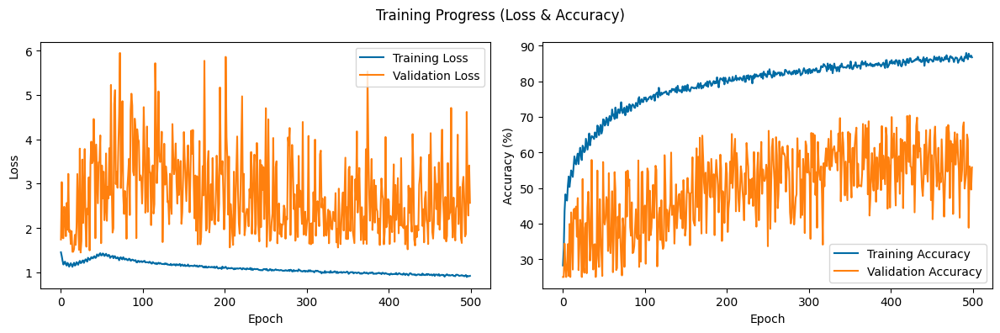

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.style.use('tableau-colorblind10')

# Plot training & validation loss
plt.subplot(1, 2, 1)
plt.plot(history["train_loss"], label="Training Loss")
plt.plot(history["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Plot training & validation accuracy
plt.subplot(1, 2, 2)
plt.plot([v * 100 for v in history["train_acc"]], label="Training Accuracy")
plt.plot([v * 100 for v in history["val_acc"]], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.legend()

plt.suptitle("Training Progress (Loss & Accuracy)")
plt.tight_layout()
plt.show()

#evaluate on test datasets

In [ ]:
def evaluate_on_loader(test_loader, name="test1", z_stats=None):
    diffe.eval()
    labels = np.arange(0, 4)
    Y, Y_hat = [], []
    with torch.no_grad():
        for x, y,sid in test_loader:
            x, y = x.to(device), y.type(torch.LongTensor).to(device)
            encoder_out = diffe.encoder(x)
            z = encoder_out[1]
            z = torch.stack([
                (z[i] - z_stats[int(sid[i].item())][0].squeeze(0)) /
                z_stats[int(sid[i].item())][1].squeeze(0)
                for i in range(z.size(0))
            ])

            y_hat = diffe.fc(encoder_out[1])
            y_hat = F.softmax(y_hat, dim=1)

            Y.append(y.detach().cpu())
            Y_hat.append(y_hat.detach().cpu())

    Y = torch.cat(Y, dim=0).numpy()
    Y_hat = torch.cat(Y_hat, dim=0).numpy()

    accuracy = top_k_accuracy_score(Y, Y_hat, k=1, labels=labels)
    print(f" {name} Accuracy: {accuracy:.2%}")
    return accuracy

In [ ]:
def evaluate_on_loader_test2(test_loader, name="test2", num_subjects=2):
    diffe.eval()
    labels = np.arange(0, 4)
    Y, Y_hat = [], []

    with torch.no_grad():
        all_x, all_y = [], []
        for x, y, _ in test_loader:
            all_x.append(x)
            all_y.append(y)
        all_x = torch.cat(all_x, dim=0).to(device)
        all_y = torch.cat(all_y, dim=0).to(device)

        samples_per_subject = 576  # 2 sessions × 288 samples
        half = samples_per_subject // 2  # 288
        quarter = half // 2  # 144

        for i in range(num_subjects):
            start = i * samples_per_subject
            end = (i + 1) * samples_per_subject
            x_sub = all_x[start:end]
            y_sub = all_y[start:end]

            _, z = diffe.encoder(x_sub)  # [576, D]

            # Use only half from each session for stats
            z_sess0_half = z[:half][:quarter]
            z_sess1_half = z[half:][:quarter]

            z_mean0 = z_sess0_half.mean(dim=0, keepdim=True)
            z_std0 = z_sess0_half.std(dim=0, keepdim=True) + 1e-6

            z_mean1 = z_sess1_half.mean(dim=0, keepdim=True)
            z_std1 = z_sess1_half.std(dim=0, keepdim=True) + 1e-6

            # Average stats
            avg_mean = (z_mean0 + z_mean1) / 2
            avg_std = (z_std0 + z_std1) / 2

            print(f"[Check] Subject {i+1}: using half-session stats — mean {avg_mean.shape}, std {avg_std.shape}")

            # Normalize all 576 samples
            z_normed = (z - avg_mean) / avg_std

            y_hat = diffe.fc(z_normed)
            y_hat = F.softmax(y_hat, dim=1)

            Y.append(y_sub.detach().cpu())
            Y_hat.append(y_hat.detach().cpu())

    Y = torch.cat(Y, dim=0).numpy()
    Y_hat = torch.cat(Y_hat, dim=0).numpy()
    accuracy = top_k_accuracy_score(Y, Y_hat, k=1, labels=labels)
    print(f" {name} Accuracy: {accuracy:.2%}")
    return accuracy


In [ ]:
acc1 = evaluate_on_loader(test1_loader, name="Test1 (Seen Subject)", z_stats=z_stats)
acc2 = evaluate_on_loader_test2(test2_loader, name="Test2 (Unseen Subject)")

 Test1 (Seen Subject) Accuracy: 58.48%
[Check] Subject 1: using half-session stats — mean torch.Size([1, 256]), std torch.Size([1, 256])
[Check] Subject 2: using half-session stats — mean torch.Size([1, 256]), std torch.Size([1, 256])
 Test2 (Unseen Subject) Accuracy: 34.11%


#plot

In [ ]:
#load saved data for plots
# encoder = EEGNet(nb_classes=num_classes, Chans=channels, Samples=250, dropoutRate=0.2, kernLength=64, F1=16, D=2, F2=32, dropoutType='Dropout').to(device)
# decoder = Decoder(in_channels=channels, n_feat=ddpm_dim, encoder_dim=encoder_dim).to(device)
# fc = LinearClassifier(encoder_dim, fc_dim, emb_dim=num_classes).to(device)

# diffe = DiffE(encoder, decoder, fc).to(device)

# ckpt_path = "/content/drive/MyDrive/project/model/ssvep/diffe_loss-1c-1supcon-1decoder-plus.pth"
# diffe.load_state_dict(torch.load(ckpt_path, map_location=device))

# diffe.eval()

In [ ]:
def visualize_signals_grid(original, masked, ddpm_out, decoder_out, sample_idxs, dataset_name, channel=0):
    """
    Creates a grid figure showing Original / Masked / DDPM / Decoder outputs per sample
    """
    import matplotlib.pyplot as plt

    num_samples = len(sample_idxs)
    fig, axes = plt.subplots(num_samples, 4, figsize=(20, 4 * num_samples), squeeze=False)

    for i, sample_idx in enumerate(sample_idxs):
        orig_np = original[sample_idx, channel].detach().cpu().numpy()
        masked_np = masked[sample_idx, channel].detach().cpu().numpy()
        ddpm_np = ddpm_out[sample_idx, channel].detach().cpu().numpy()
        decoder_np = decoder_out[sample_idx, channel].detach().cpu().numpy()

        axes[i, 0].plot(orig_np, color='blue')
        axes[i, 0].set_title(f"{dataset_name} Sample {sample_idx} – Original")

        axes[i, 1].plot(masked_np, color='orange')
        axes[i, 1].set_title("Masked")

        axes[i, 2].plot(ddpm_np, color='green')
        axes[i, 2].set_title("DDPM Output")

        axes[i, 3].plot(decoder_np, color='red')
        axes[i, 3].set_title("Decoder Output")

        for j in range(4):
            axes[i, j].set_xlabel("Time")
            axes[i, j].set_ylabel("Amplitude")

    fig.suptitle(f"{dataset_name} EEG Signal Visualization", fontsize=18)
    fig.tight_layout()
    return fig

In [ ]:
def visualize_sample_stacked(original, masked, ddpm_out, decoder_out, sample_idxs=[0], channel=0, dataset_name="Dataset"):
    import matplotlib.pyplot as plt

    for idx in sample_idxs:
        fig, axes = plt.subplots(4, 1, figsize=(15, 8), sharex=True)

        signals = [
            original[idx, channel].detach().cpu().numpy(),
            masked[idx, channel].detach().cpu().numpy(),
            ddpm_out[idx, channel].detach().cpu().numpy(),
            decoder_out[idx, channel].detach().cpu().numpy()
        ]
        titles = ["Original", "Masked", "DDPM Output", "Decoder Output"]
        colors = ["blue", "orange", "green", "red"]

        for i in range(4):
            axes[i].plot(signals[i], color=colors[i])
            axes[i].set_title(f"{dataset_name} Sample {idx} – {titles[i]}")
            axes[i].set_ylabel("Amplitude")

        axes[-1].set_xlabel("Time")
        fig.suptitle(f"{dataset_name} Sample {idx} – Channel {channel}", fontsize=16)
        fig.tight_layout()
        plt.show()


In [ ]:
def visualize_sample_overlayed(original, masked, ddpm_out, decoder_out, sample_idxs=[0], channel=0, dataset_name="Dataset"):
    import matplotlib.pyplot as plt

    for idx in sample_idxs:
        fig, ax = plt.subplots(figsize=(15, 4))

        signals = [
            original[idx, channel].detach().cpu().numpy(),
            masked[idx, channel].detach().cpu().numpy(),
            ddpm_out[idx, channel].detach().cpu().numpy(),
            decoder_out[idx, channel].detach().cpu().numpy()
        ]
        labels = ["Original", "Masked", "DDPM Output", "Decoder Output"]
        colors = ["blue", "orange", "green", "red"]
        styles = ["solid", "dashed", "dashdot", "solid"]

        for signal, label, color, style in zip(signals, labels, colors, styles):
            ax.plot(signal, label=label, color=color, linestyle=style)

        ax.set_title(f"{dataset_name} Sample {idx} – Overlaid Signals (Channel {channel})")
        ax.set_xlabel("Time")
        ax.set_ylabel("Amplitude")
        ax.legend()
        plt.tight_layout()
        plt.show()


In [ ]:
def visualize_all_datasets(loaders_dict, model_ddpm, model_diffe, device, sample_idxs=[0, 1, 2], channel=0):
    model_ddpm.eval()
    model_diffe.eval()

    for name, loader in loaders_dict.items():
        with torch.no_grad():
            for x, _,_ in loader:
                x = x.to(device)

                # Forward through DDPM
                x_hat, down, up, noise, t = model_ddpm(x)
                ddpm_out = (x_hat, down, up, t)
                x_masked = x + noise

                # Align time dimension
                min_len = min(x.shape[2], x_hat.shape[2], noise.shape[2])
                x = x[..., :min_len]
                x_hat = x_hat[..., :min_len]
                x_masked = x_masked[..., :min_len]

                # Forward through DiffE
                decoder_out, _, _ = model_diffe(x, ddpm_out)
                decoder_out = decoder_out[..., :min_len]

                # Visualize
                fig = visualize_signals_grid(x, x_masked, x_hat, decoder_out, sample_idxs, dataset_name=name, channel=channel)
                plt.show()

                visualize_sample_stacked(
                    original=x,
                    masked=x_masked,
                    ddpm_out=x_hat,
                    decoder_out=decoder_out,
                    sample_idxs=sample_idxs,
                    channel=channel,
                    dataset_name=name
                )

                visualize_sample_overlayed(
                    original=x,
                    masked=x_masked,
                    ddpm_out=x_hat,
                    decoder_out=decoder_out,
                    sample_idxs=sample_idxs,
                    channel=channel,
                    dataset_name=name
                )


                break


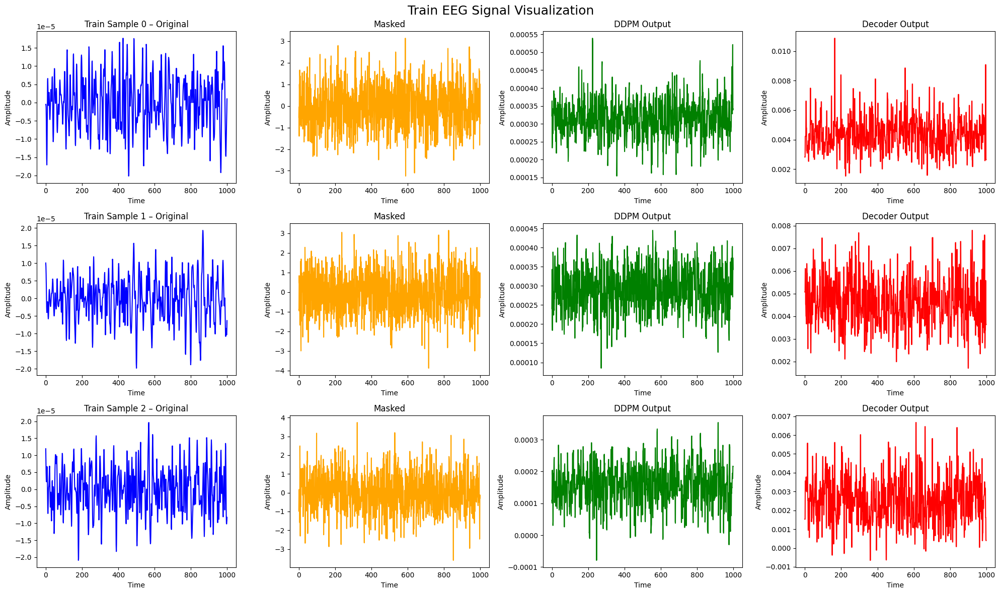

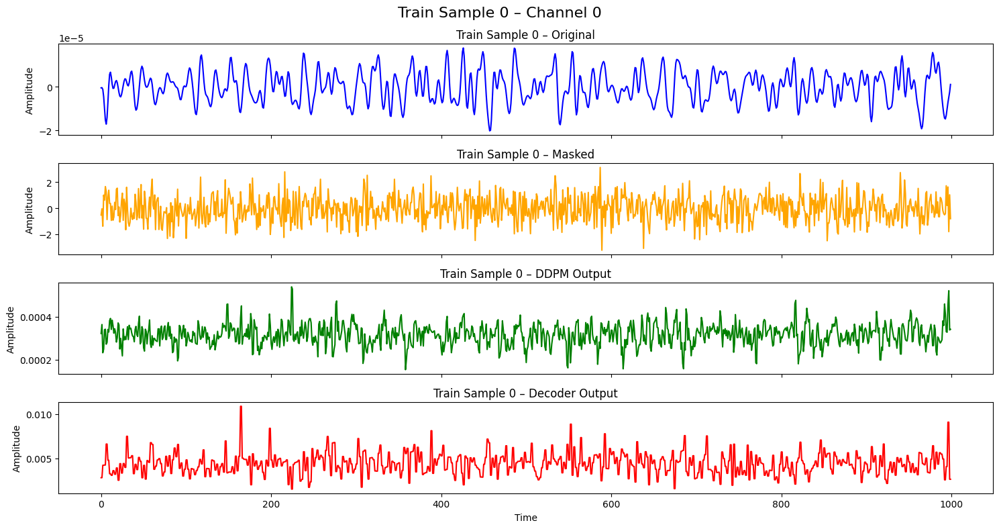

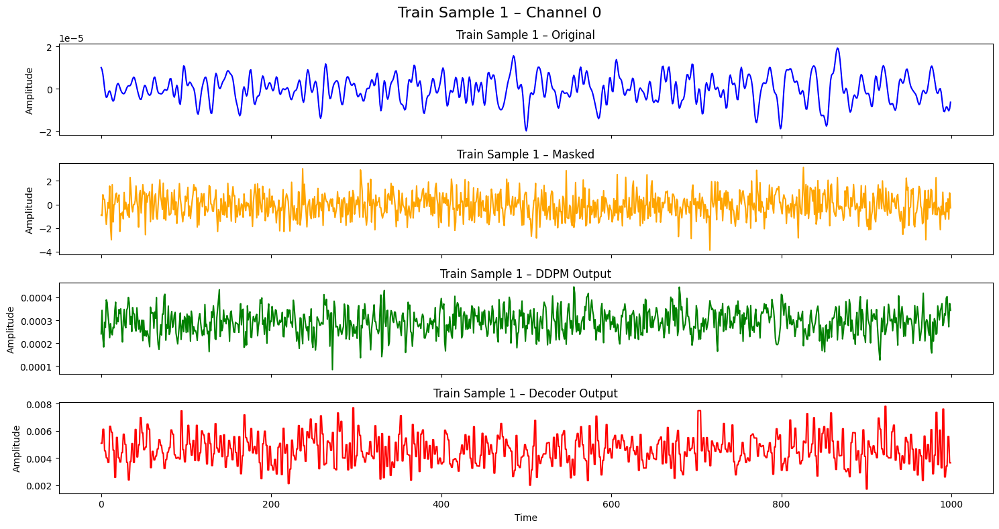

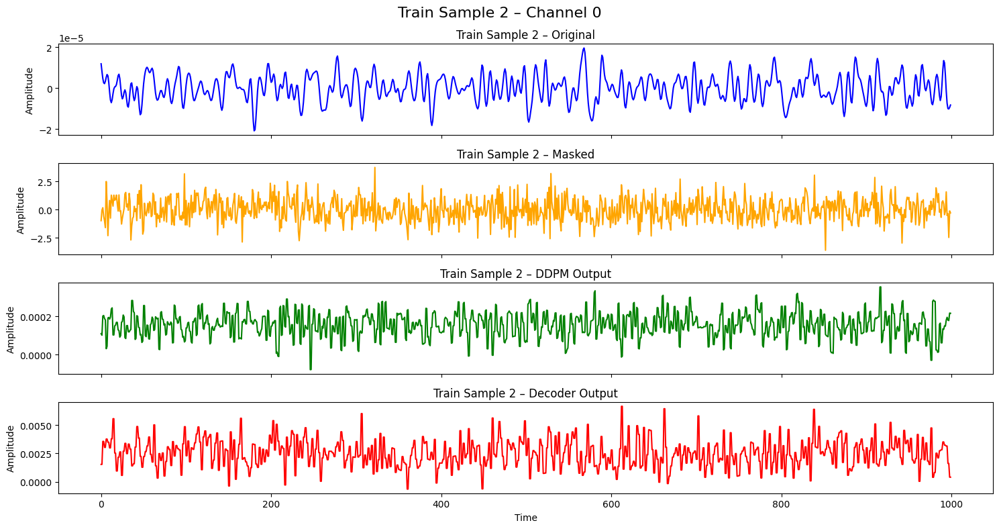

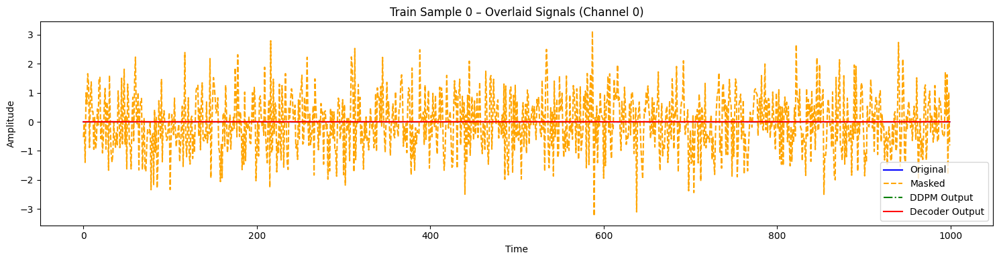

...

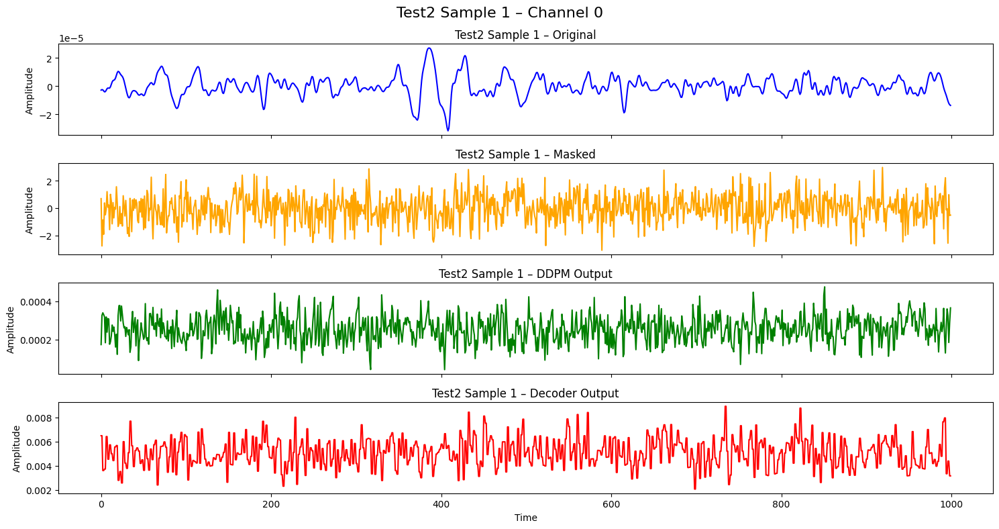

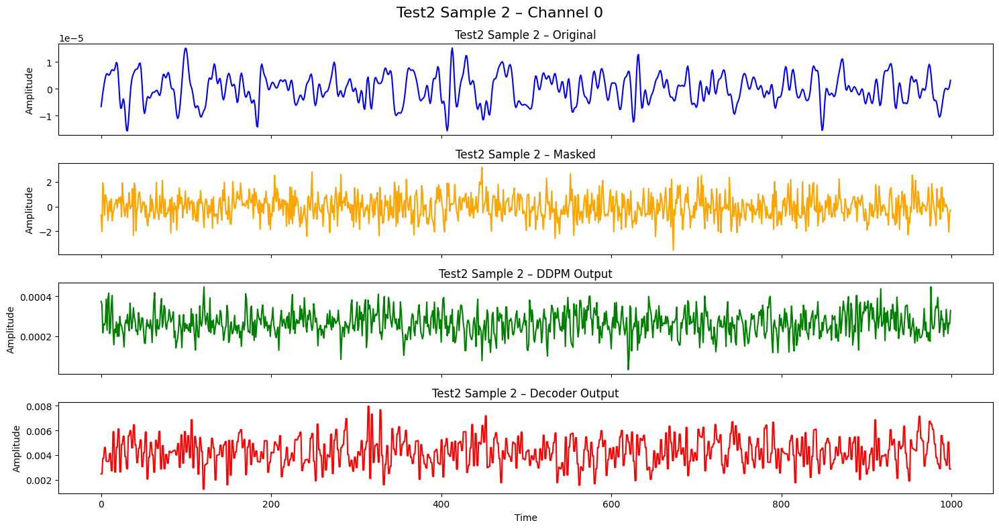

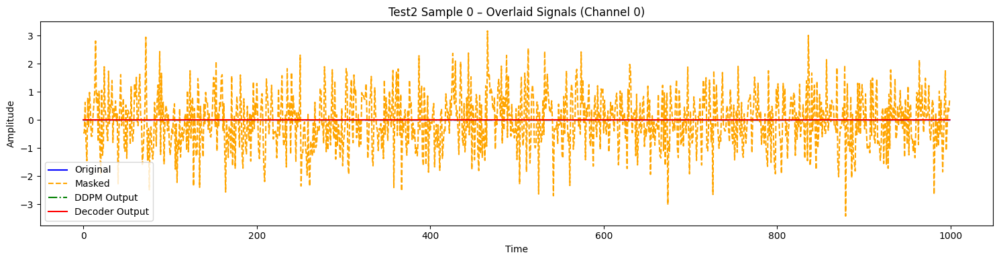

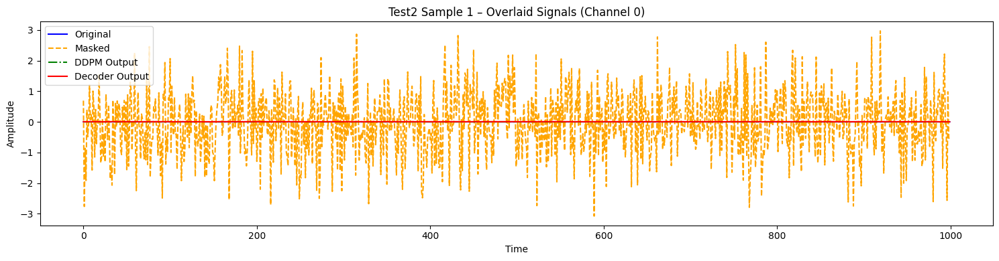

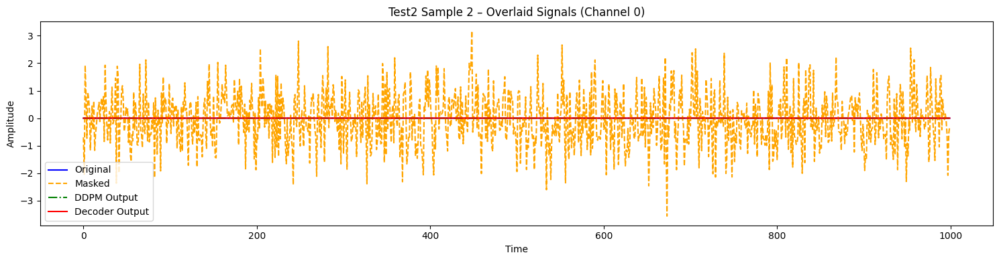

In [ ]:
loaders = {
    "Train": train_loader,
    "Validation": val_loader,
    "Test1": test1_loader,
    "Test2": test2_loader,
}

visualize_all_datasets(loaders, ddpm, diffe, device, sample_idxs=[0, 1, 2], channel=0)

# t-SNE

In [ ]:
#used only for tsne plot
# class EEGDataset(Dataset):
#     "Characterizes a dataset for PyTorch"

#     def __init__(self, X, Y, subject_ids=None, transform=None):
#         "Initialization"
#         self.X = X
#         self.Y = Y
#         self.subject_ids = subject_ids if subject_ids is not None else torch.zeros(len(Y), dtype=torch.long)
#         self.transform = transform

#     def __len__(self):
#         return len(self.X)

#     def __getitem__(self, index):
#         x = self.X[index]
#         y = self.Y[index]
#         sid = self.subject_ids[index]

#         if self.transform:
#             x = self.transform(x)

#         return x.squeeze(), y, sid

# def load_split_dataset(root_dir, num_seen, seed=43):
#     random.seed(seed)

#     all_subjects = list(range(1, 36))
#     seen_subjects = random.sample(all_subjects, num_seen)#25 seen
#     unseen_subjects = [sid for sid in all_subjects if sid not in seen_subjects]#10 unseen

#     split_cfg = {
#         "train":  [(sid, [0, 1, 2, 3]) for sid in seen_subjects],
#         "val":    [(sid, [4]) for sid in seen_subjects],
#         "val2":    [(sid, [4]) for sid in seen_subjects],
#         "test1":  [(sid, [5]) for sid in seen_subjects],
#         "test2":  [(sid, [0, 1, 2, 3, 4, 5]) for sid in unseen_subjects]
#     }

#     print(f"[Split] Seen subjects (train/val/test1): {seen_subjects}")
#     print(f"[Split] Unseen subjects (test2): {unseen_subjects}")

#     loaders = {}
#     subject_id_dict = {}

#     for split, sid_sess in split_cfg.items():
#         X_all, Y_all = [], []
#         subject_ids = []
#         for sid, sess in sid_sess:
#             X, Y = load_data_by_session(root_dir, sid, sess)
#             X_all.append(X)
#             Y_all.append(Y)
#             subject_ids.extend([sid] * len(Y))
#         X_all = torch.cat(X_all, dim=0)
#         Y_all = torch.cat(Y_all, dim=0)
#         dataset = EEGDataset(X_all, Y_all, subject_ids=torch.tensor(subject_ids, dtype=torch.long))
#         loaders[split] = DataLoader(dataset, batch_size=32, shuffle = (split in ["train", "val2"]))
#         subject_id_dict[split] = torch.tensor(subject_ids, dtype=torch.long)

#     # return subject_id list for t-SNE
#     for split in ["train", "val"]:
#         if split in subject_id_dict:
#             loaders[f"{split}_subjects"] = subject_id_dict[split]
#     return loaders


In [ ]:
# subject_chars_dir = '/content/drive/MyDrive/project/dataset/ssvep/chars' # Where to store all character data
# subject_ids = list(range(1, 36)) #35 samples + 1

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# batch_size = 32
# batch_size2 = 260
# seed = 44 #same as the training
# shuffle = True

# # load all subjects' data
# loaders = load_split_dataset(subject_chars_dir, num_seen=33, seed=seed)
# train_loader = loaders["train"]
# val_loader = loaders["val"]
# val2_loader = loaders["val2"]
# test1_loader = loaders["test1"]
# test2_loader = loaders["test2"]
# train_iter = iter(train_loader)


In [ ]:
# print(">>> First 30 subject_ids from dataloader (sid):")
# with torch.no_grad():
#     x, y, sid = next(train_iter)
#     print(sid[:30].tolist())


In [ ]:
#PCA
from sklearn.decomposition import PCA

def pca_and_plot(X, color, title, color_type='label'):
    X_pca = PCA(n_components=2).fit_transform(X)
    classes = sorted(np.unique(color))
    cmap = cm.get_cmap('tab20', len(classes))
    plt.figure(figsize=(12, 9))
    for i, c in enumerate(classes):
        idx = (color == c)
        plt.scatter(X_pca[idx, 0], X_pca[idx, 1], label=f"{color_type} {c}", color=cmap(i / len(classes)), s=10)
    plt.title(f"{title} (PCA by {color_type})")
    plt.legend(markerscale=2, fontsize="x-small", bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
    plt.tight_layout()
    plt.show()


>>> First 30 labels from train dataloader (label y):
[3, 1, 0, 2, 1, 0, 2, 0, 0, 2, 3, 0, 1, 1, 1, 3, 3, 2, 0, 1, 3, 3, 3, 3, 1, 3, 1, 0, 3, 1]
>>> First 30 labels used for t-SNE coloring (train):
[3, 1, 0, 2, 1, 0, 2, 0, 0, 2, 3, 0, 1, 1, 1, 3, 3, 2, 0, 1, 3, 3, 3, 3, 1, 3, 1, 0, 3, 1]
>>> First 30 labels from label_all_train:
[3, 1, 0, 2, 1, 0, 2, 0, 0, 2, 3, 0, 1, 1, 1, 3, 3, 2, 0, 1, 3, 3, 3, 3, 1, 3, 1, 0, 3, 1]
Running t-SNE on 2688 samples...


<ipython-input-51-87d8c75c14ac>:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


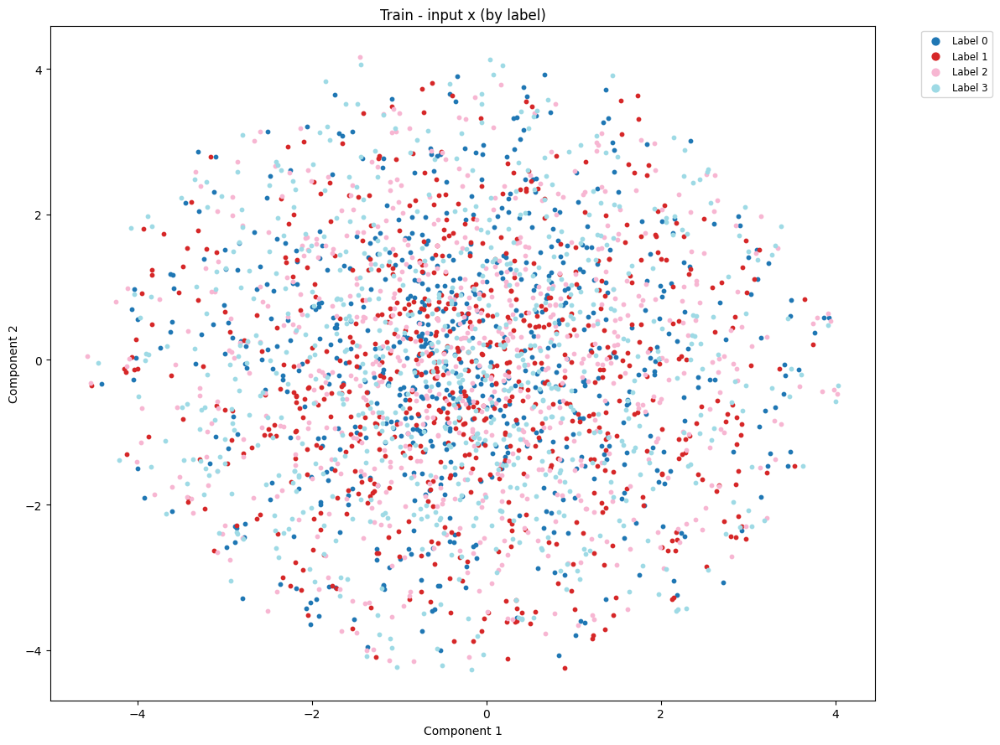

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


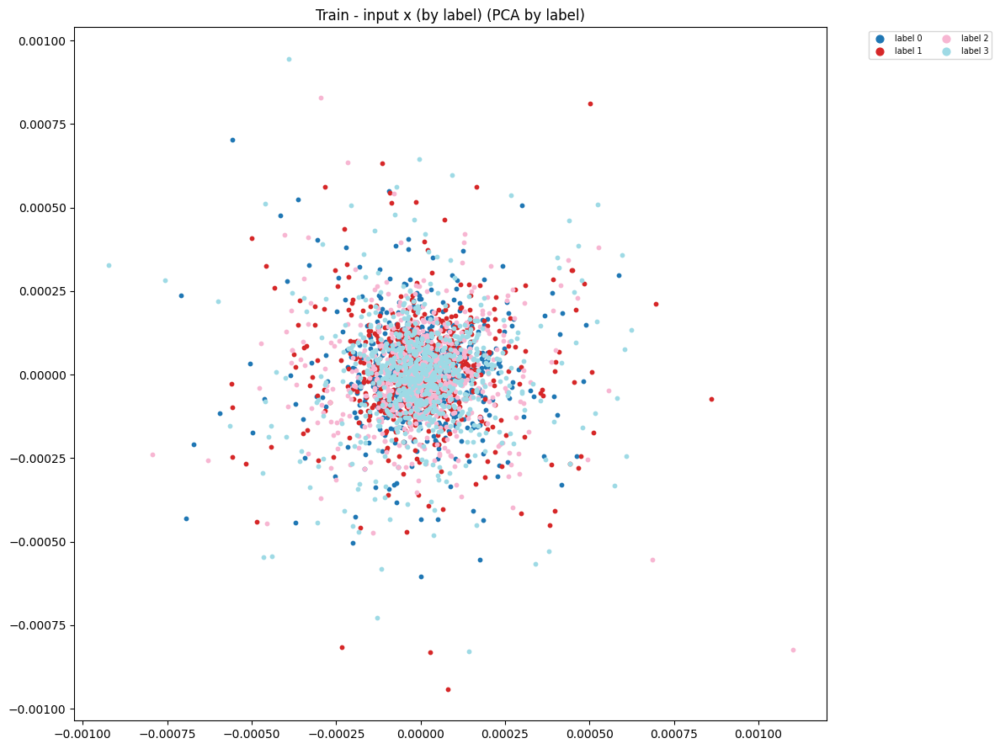

Running t-SNE on 2688 samples...


<ipython-input-51-87d8c75c14ac>:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


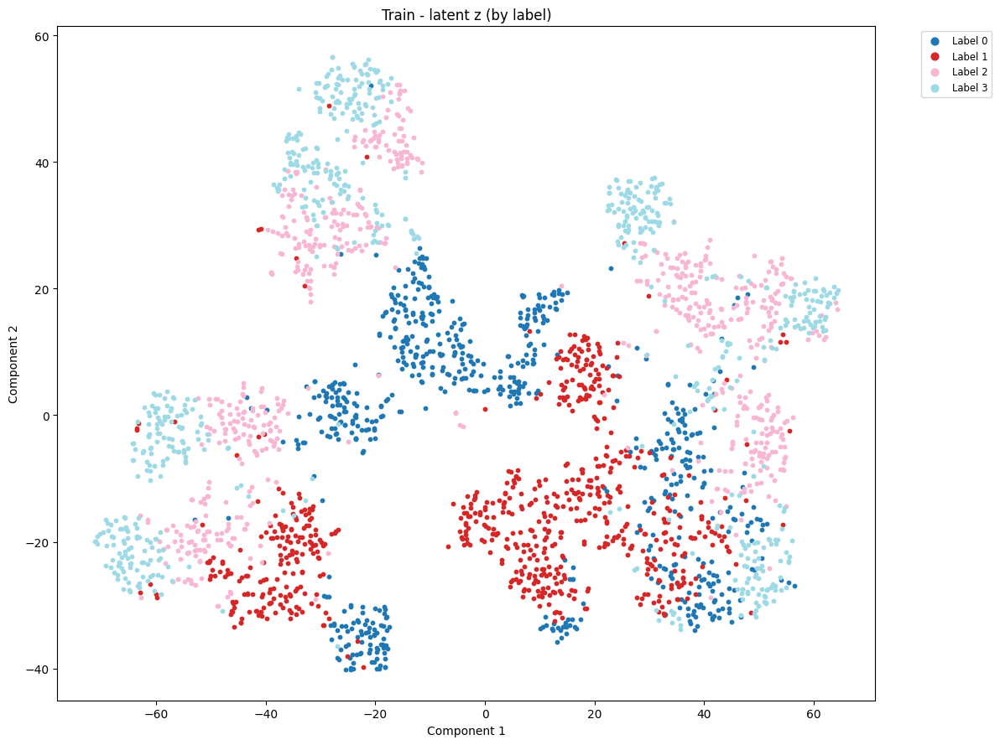

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


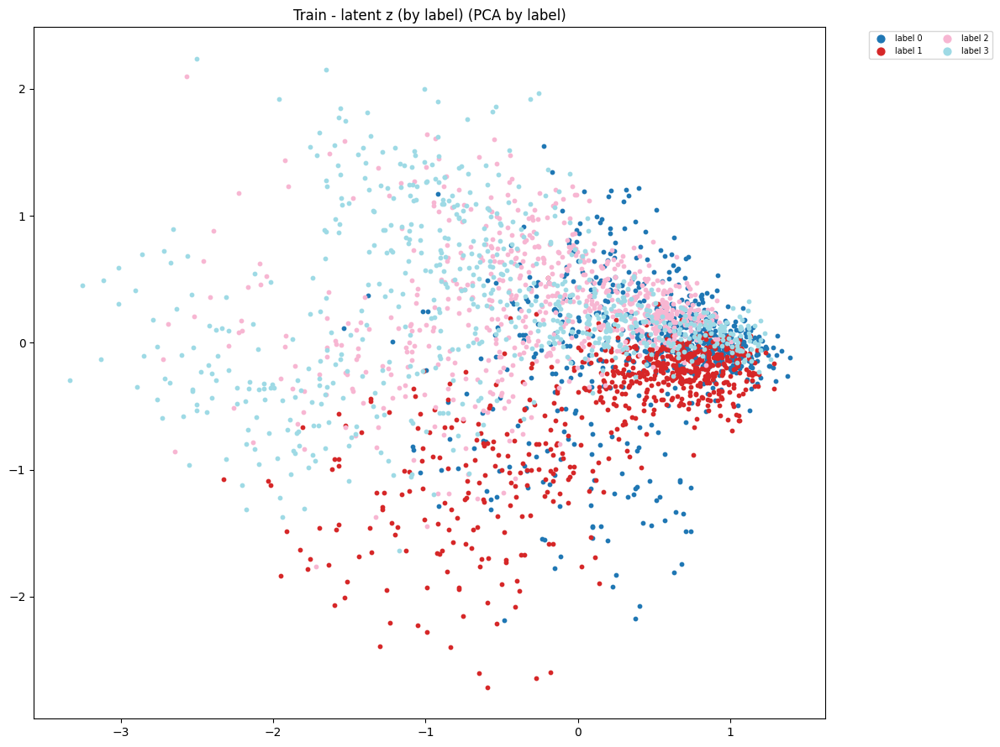

Running t-SNE on 2688 samples...


<ipython-input-51-87d8c75c14ac>:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


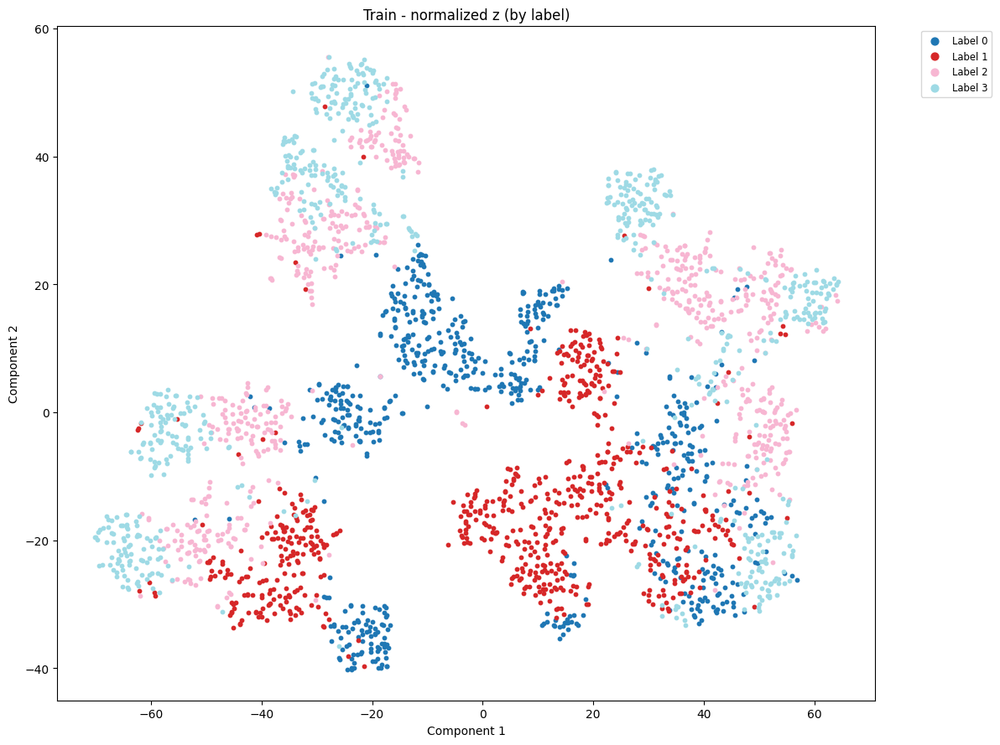

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


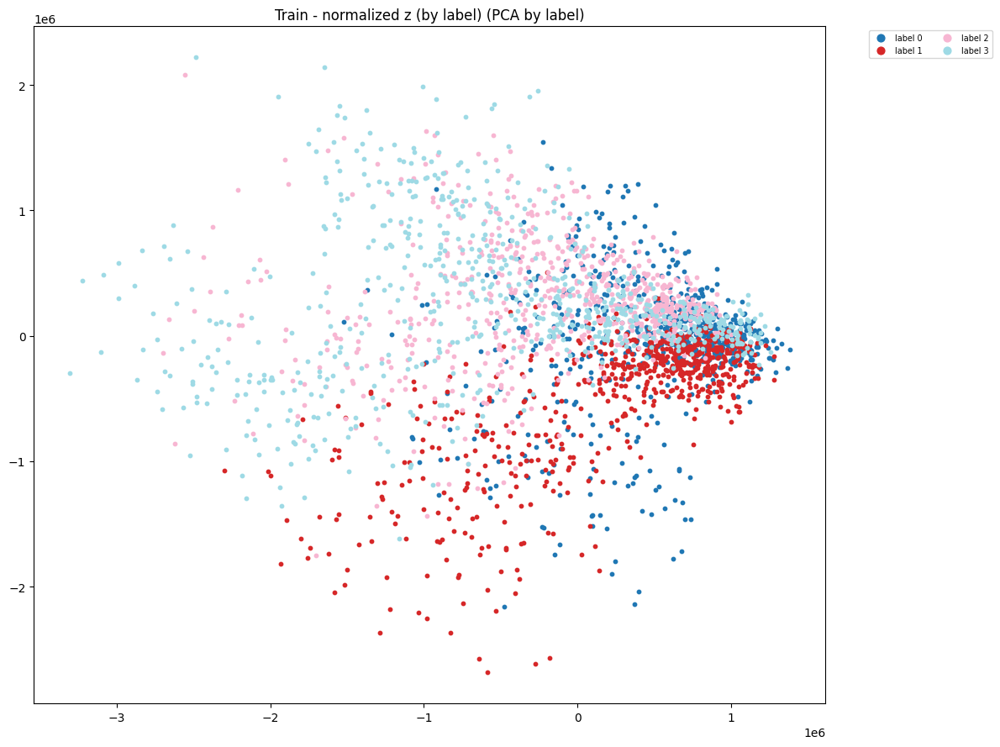

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#train by label
train_iter = iter(train_loader)

x0_train, y0_train, sid0_train = next(train_iter)
print(">>> First 30 labels from train dataloader (label y):")
print(y0_train[:30].tolist())

_, z0_train = encoder(x0_train.to(device))
z_list_train = [z0_train.detach().cpu()]
x_list_train = [x0_train.view(x0_train.size(0), -1).detach().cpu()]
label_list_train = [y0_train.cpu()]
first_30_label_train = y0_train[:30].tolist()

sid_list_train = [sid0_train.cpu()]

with torch.no_grad():
    for x, y, sid in train_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_train.append(z.detach().cpu())
        x_list_train.append(x.view(x.size(0), -1).detach().cpu())
        label_list_train.append(y.cpu())
        sid_list_train.append(sid.cpu())

z_all_train_tensor = torch.cat(z_list_train, dim=0)
sid_all_train_tensor = torch.cat(sid_list_train, dim=0)

z_all_train_normed = torch.stack([
    (z_all_train_tensor[i] - z_stats[int(sid_all_train_tensor[i])][0].squeeze(0).cpu()) /
    z_stats[int(sid_all_train_tensor[i])][1].squeeze(0).cpu()
    for i in range(z_all_train_tensor.size(0))
])

z_all_train = torch.cat(z_list_train, dim=0).numpy()
x_all_train = torch.cat(x_list_train, dim=0).numpy()
label_all_train = torch.cat(label_list_train, dim=0).numpy()
sid_all_train = torch.cat(sid_list_train, dim=0).numpy()

print(">>> First 30 labels used for t-SNE coloring (train):")
print(first_30_label_train)
print(">>> First 30 labels from label_all_train:")
print(label_all_train[:30].tolist())

def tsne_visualize_by_label(X, labels, title="t-SNE visualization by label"):
    print(f"Running t-SNE on {len(labels)} samples...")
    X_emb = TSNE(n_components=2, perplexity=30, learning_rate=200).fit_transform(X)

    unique_labels = sorted(np.unique(labels))
    n_classes = len(unique_labels)
    cmap = cm.get_cmap('tab20', n_classes)

    plt.figure(figsize=(12, 9))
    for i, lab in enumerate(unique_labels):
        idx = (labels == lab)
        plt.scatter(X_emb[idx, 0], X_emb[idx, 1], label=f"Label {lab}", color=cmap(i / n_classes), s=10)

    plt.legend(markerscale=2, fontsize="small", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.tight_layout()
    plt.show()

tsne_visualize_by_label(x_all_train, label_all_train, title="Train - input x (by label)")
pca_and_plot(x_all_train, label_all_train, f"Train - input x (by label)", color_type='label')
tsne_visualize_by_label(z_all_train, label_all_train, title="Train - latent z (by label)")
pca_and_plot(z_all_train, label_all_train, f"Train - latent z (by label)", color_type='label')

tsne_visualize_by_label(z_all_train_normed, label_all_train, title="Train - normalized z (by label)")
pca_and_plot(z_all_train_normed, label_all_train, f"Train - normalized z (by label)", color_type='label')

# perm_train = np.random.permutation(len(label_all_train))
# tsne_visualize_by_label(z_all_train, label_all_train[perm_train], title="Train - Shuffled Label Visualization")
# pca_and_plot(z_all_train, label_all_train[perm_train], f"Train - Shuffled Label Visualization", color_type='label')


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.metrics import (
    accuracy_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    silhouette_score
)
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_train, label_all_train)
acc = accuracy_score(label_all_train, clf.predict(z_all_train))
results['linear_probe_label_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_train, label_all_train)
knn_acc = accuracy_score(label_all_train, knn.predict(z_all_train))
results['knn_label_acc'] = knn_acc

kmeans_label = KMeans(n_clusters=len(np.unique(label_all_train)), random_state=0).fit(z_all_train)
ari_label = adjusted_rand_score(label_all_train, kmeans_label.labels_)
nmi_label = normalized_mutual_info_score(label_all_train, kmeans_label.labels_)
results['ARI_label'] = ari_label
results['NMI_label'] = nmi_label

sil = silhouette_score(z_all_train, label_all_train)
results['silhouette_z'] = sil

for k, v in results.items():
    print(f"{k}: {v:.4f}")


linear_probe_label_acc: 0.8382
knn_label_acc: 0.9297
ARI_label: 0.1677
NMI_label: 0.1824
silhouette_z: 0.0451


>>> First 30 labels from val dataloader (label y):
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
>>> First 30 labels used for t-SNE coloring (val):
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
>>> First 30 labels from label_all_val:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
Running t-SNE on 672 samples...


<ipython-input-51-87d8c75c14ac>:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


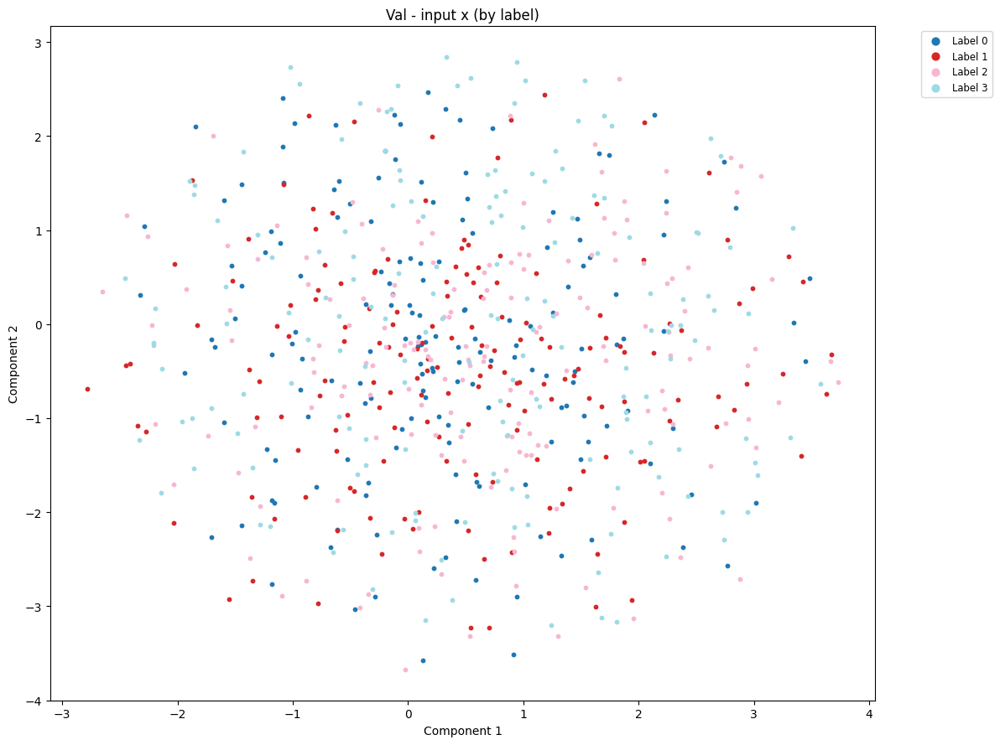

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


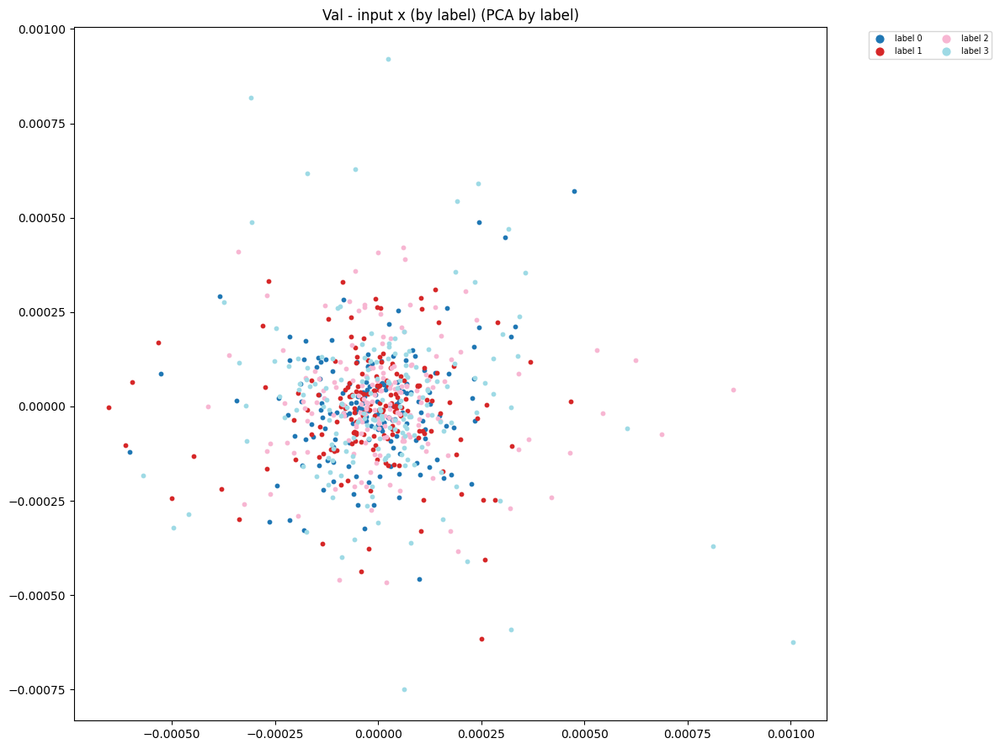

Running t-SNE on 672 samples...


<ipython-input-51-87d8c75c14ac>:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


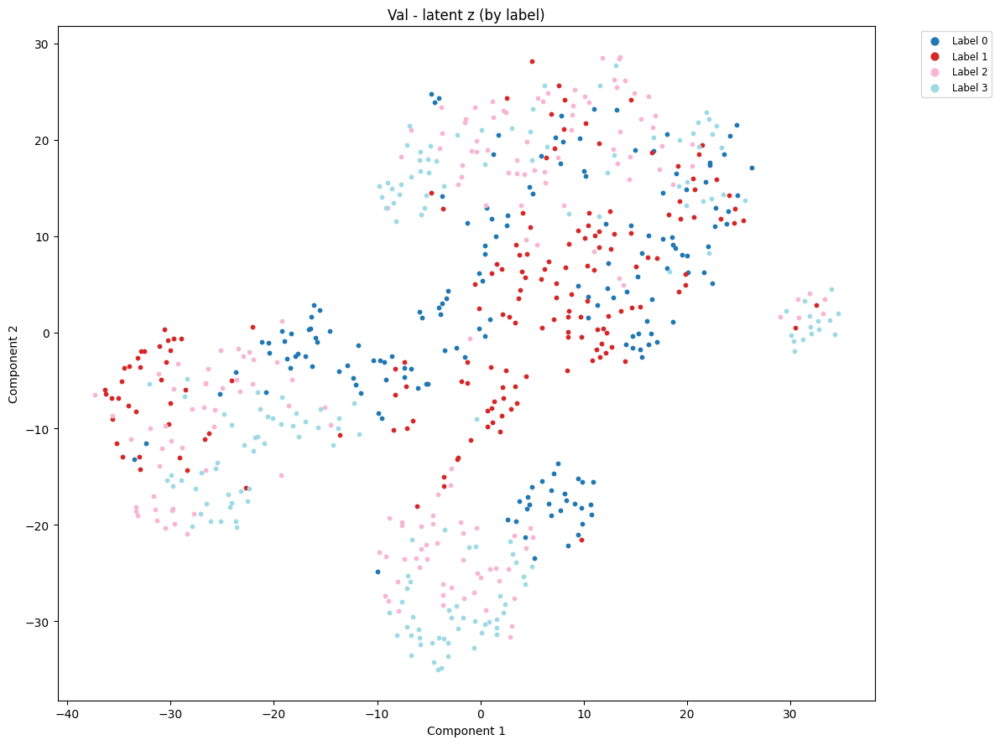

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


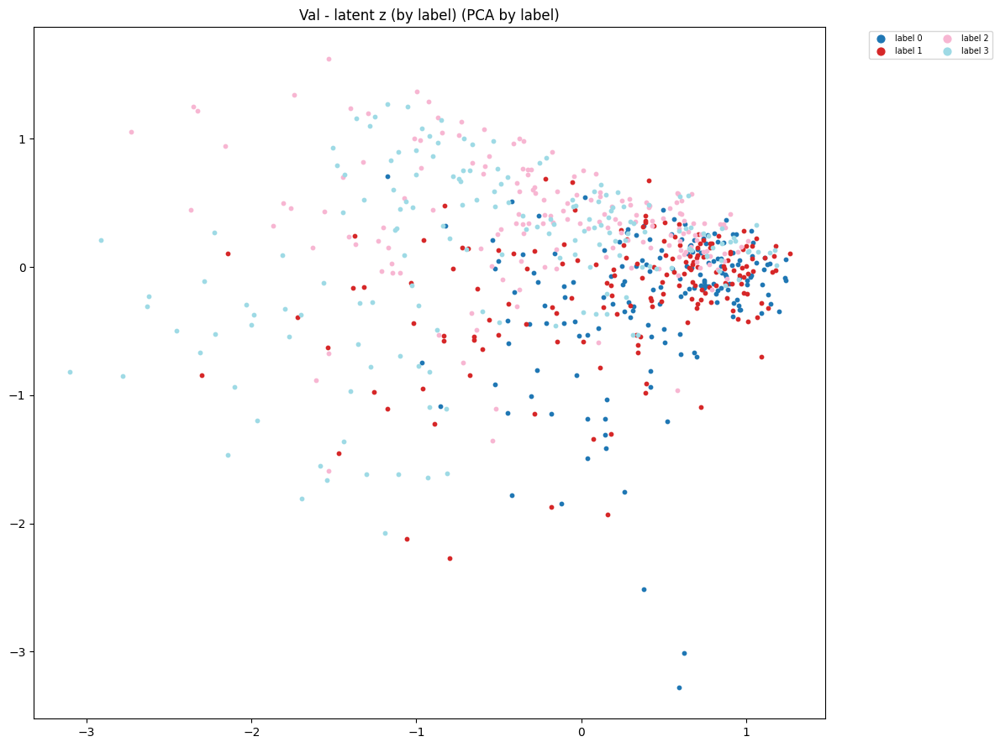

Running t-SNE on 672 samples...


<ipython-input-51-87d8c75c14ac>:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


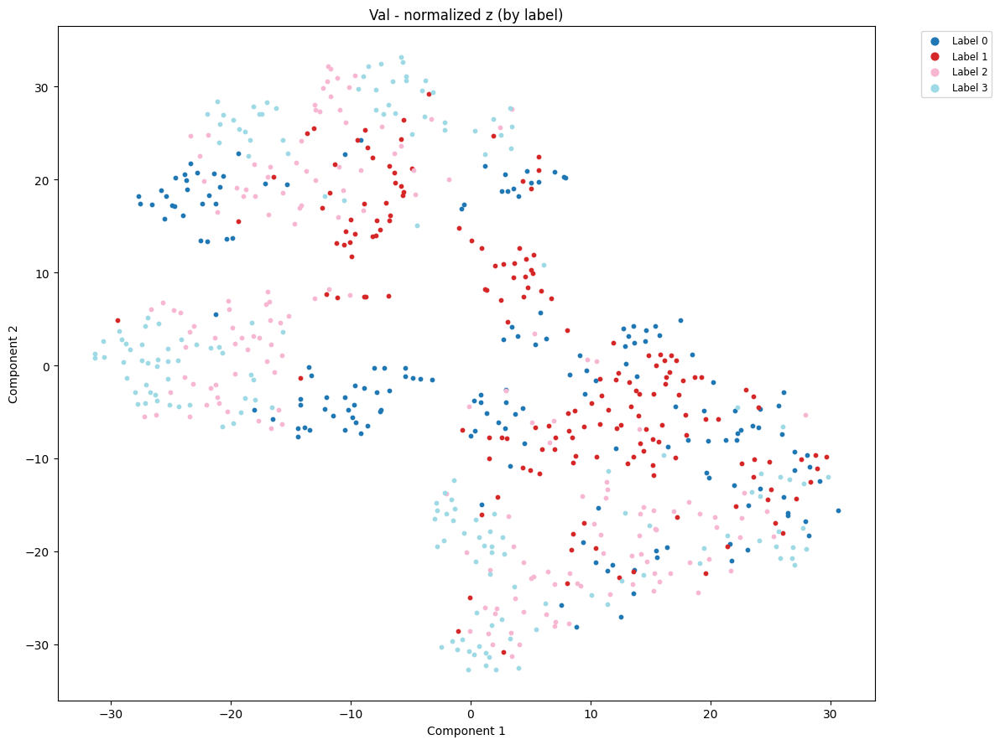

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


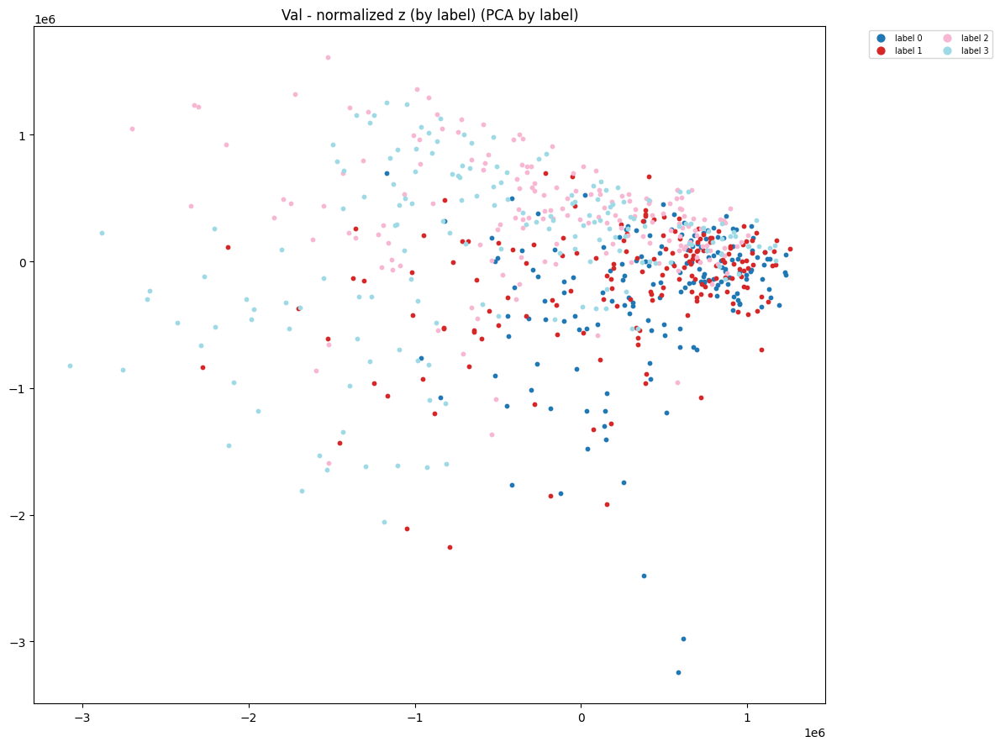

In [ ]:
#val by label (shuffle=F)
val_iter = iter(val_loader)

x0_val, y0_val, sid0_val = next(val_iter)
print(">>> First 30 labels from val dataloader (label y):")
print(y0_val[:30].tolist())

_, z0_val = encoder(x0_val.to(device))
z_list_val = [z0_val.detach().cpu()]
x_list_val = [x0_val.view(x0_val.size(0), -1).detach().cpu()]
label_list_val = [y0_val.cpu()]
first_30_label_val = y0_val[:30].tolist()

sid_list_val = [sid0_val.cpu()]

with torch.no_grad():
    for x, y, sid in val_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_val.append(z.detach().cpu())
        x_list_val.append(x.view(x.size(0), -1).detach().cpu())
        label_list_val.append(y.cpu())
        sid_list_val.append(sid.cpu())

z_all_val_tensor = torch.cat(z_list_val, dim=0)
sid_all_val_tensor = torch.cat(sid_list_val, dim=0)

z_all_val_normed = torch.stack([
    (z_all_val_tensor[i] - z_stats[int(sid_all_val_tensor[i])][0].squeeze(0).cpu()) /
    z_stats[int(sid_all_val_tensor[i])][1].squeeze(0).cpu()
    for i in range(z_all_val_tensor.size(0))
])

z_all_val = torch.cat(z_list_val, dim=0).numpy()
x_all_val = torch.cat(x_list_val, dim=0).numpy()
label_all_val = torch.cat(label_list_val, dim=0).numpy()
sid_all_val = torch.cat(sid_list_val, dim=0).numpy()  #

print(">>> First 30 labels used for t-SNE coloring (val):")
print(first_30_label_val)
print(">>> First 30 labels from label_all_val:")
print(label_all_val[:30].tolist())

tsne_visualize_by_label(x_all_val, label_all_val, title="Val - input x (by label)")
pca_and_plot(x_all_val, label_all_val, f"Val - input x (by label)", color_type='label')

tsne_visualize_by_label(z_all_val, label_all_val, title="Val - latent z (by label)")
pca_and_plot(z_all_val, label_all_val, f"Val - latent z (by label)", color_type='label')

tsne_visualize_by_label(z_all_val_normed, label_all_val, title="Val - normalized z (by label)")
pca_and_plot(z_all_val_normed, label_all_val, f"Val - normalized z (by label)", color_type='label')


In [ ]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_val, label_all_val)
acc = accuracy_score(label_all_val, clf.predict(z_all_val))
results['linear_probe_label_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_val, label_all_val)
knn_acc = accuracy_score(label_all_val, knn.predict(z_all_val))
results['knn_label_acc'] = knn_acc

kmeans_label = KMeans(n_clusters=len(np.unique(label_all_val)), random_state=0).fit(z_all_val)
ari_label = adjusted_rand_score(label_all_val, kmeans_label.labels_)
nmi_label = normalized_mutual_info_score(label_all_val, kmeans_label.labels_)
results['ARI_label'] = ari_label
results['NMI_label'] = nmi_label

sil = silhouette_score(z_all_val, label_all_val)
results['silhouette_z'] = sil

for k, v in results.items():
    print(f"{k}: {v:.4f}")


linear_probe_label_acc: 0.6830
knn_label_acc: 0.7827
ARI_label: 0.0455
NMI_label: 0.0895
silhouette_z: 0.0014


In [ ]:
#val2 by label (shuffle=T)
val_iter = iter(val2_loader)

x0_val, y0_val, sid0_val = next(val_iter)
print(">>> First 30 labels from val dataloader (label y):")
print(y0_val[:30].tolist())

_, z0_val = encoder(x0_val.to(device))
z_list_val = [z0_val.detach().cpu()]
x_list_val = [x0_val.view(x0_val.size(0), -1).detach().cpu()]
label_list_val = [y0_val.cpu()]
first_30_label_val = y0_val[:30].tolist()

sid_list_val = [sid0_val.cpu()]

with torch.no_grad():
    for x, y, sid in val_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_val.append(z.detach().cpu())
        x_list_val.append(x.view(x.size(0), -1).detach().cpu())
        label_list_val.append(y.cpu())
        sid_list_val.append(sid.cpu())

z_all_val = torch.cat(z_list_val, dim=0).numpy()
x_all_val = torch.cat(x_list_val, dim=0).numpy()
label_all_val = torch.cat(label_list_val, dim=0).numpy()
sid_all_val = torch.cat(sid_list_val, dim=0).numpy()  #

print(">>> First 30 labels used for t-SNE coloring (val):")
print(first_30_label_val)
print(">>> First 30 labels from label_all_val:")
print(label_all_val[:30].tolist())

tsne_visualize_by_label(x_all_val, label_all_val, title="Val - input x (by label)")
pca_and_plot(x_all_val, label_all_val, f"Val - input x (by label)", color_type='label')

tsne_visualize_by_label(z_all_val, label_all_val, title="Val - latent z (by label)")
pca_and_plot(z_all_val, label_all_val, f"Val - latent z(by label)", color_type='label')

NameError: name 'val2_loader' is not defined

In [ ]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_val, label_all_val)
acc = accuracy_score(label_all_val, clf.predict(z_all_val))
results['linear_probe_label_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_val, label_all_val)
knn_acc = accuracy_score(label_all_val, knn.predict(z_all_val))
results['knn_label_acc'] = knn_acc

kmeans_label = KMeans(n_clusters=len(np.unique(label_all_val)), random_state=0).fit(z_all_val)
ari_label = adjusted_rand_score(label_all_val, kmeans_label.labels_)
nmi_label = normalized_mutual_info_score(label_all_val, kmeans_label.labels_)
results['ARI_label'] = ari_label
results['NMI_label'] = nmi_label

sil = silhouette_score(z_all_val, label_all_val)
results['silhouette_z'] = sil

for k, v in results.items():
    print(f"{k}: {v:.4f}")


In [ ]:
def tsne_visualize_latentz_by_subject(X, subject_ids, title="t-SNE of latent z (colored by subject)"):
    print(f"Running t-SNE on {len(subject_ids)} samples...")
    X_emb = TSNE(n_components=2, perplexity=30, learning_rate=200).fit_transform(X)

    unique_subjects = sorted(np.unique(subject_ids))
    n_subjects = len(unique_subjects)
    colormap = cm.get_cmap('tab20', n_subjects)

    plt.figure(figsize=(12, 9))
    for i, sid in enumerate(unique_subjects):
        idx = (subject_ids == sid)
        plt.scatter(X_emb[idx, 0], X_emb[idx, 1], label=f"Subject {sid}", color=colormap(i / n_subjects), s=10)

    plt.legend(markerscale=2, fontsize="x-small", bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.tight_layout()
    plt.show()


>>> First 30 subject_ids from dataloader (sid):
[8, 7, 2, 9, 3, 4, 2, 1, 7, 7, 8, 7, 3, 4, 1, 9, 3, 1, 3, 2, 8, 9, 2, 8, 1, 4, 3, 8, 4, 7]
>>> First 30 subject_ids used for t-SNE coloring:
[8, 7, 2, 9, 3, 4, 2, 1, 7, 7, 8, 7, 3, 4, 1, 9, 3, 1, 3, 2, 8, 9, 2, 8, 1, 4, 3, 8, 4, 7]
ARI score: 0.23389552021721918
Running t-SNE on 2688 samples...


<ipython-input-56-3c2b76cb6440>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


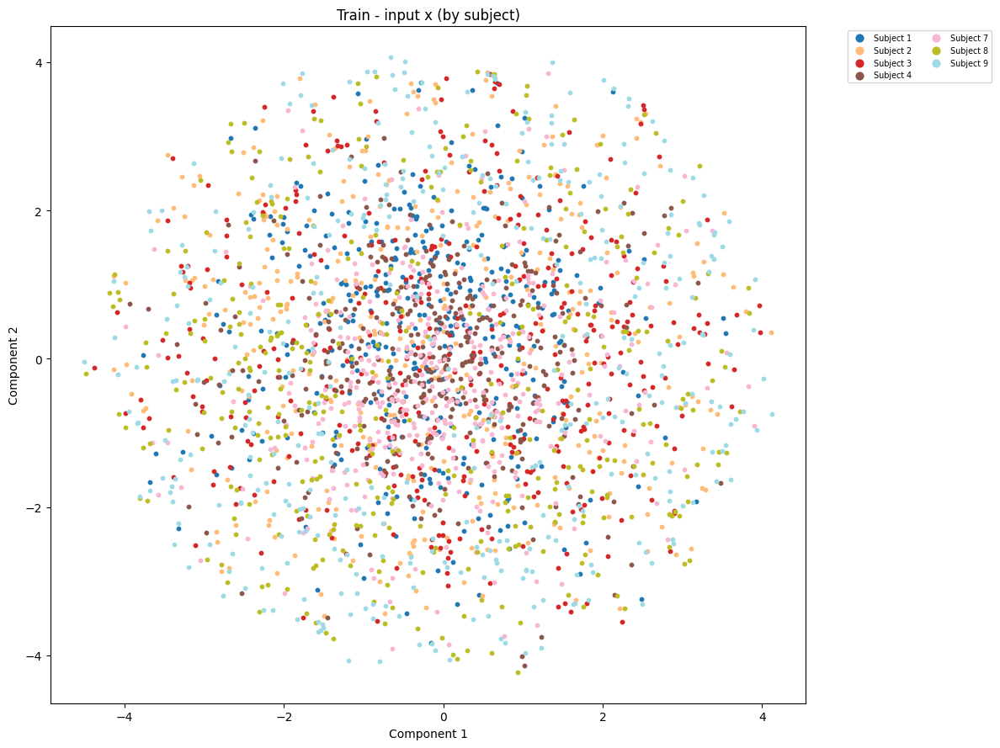

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


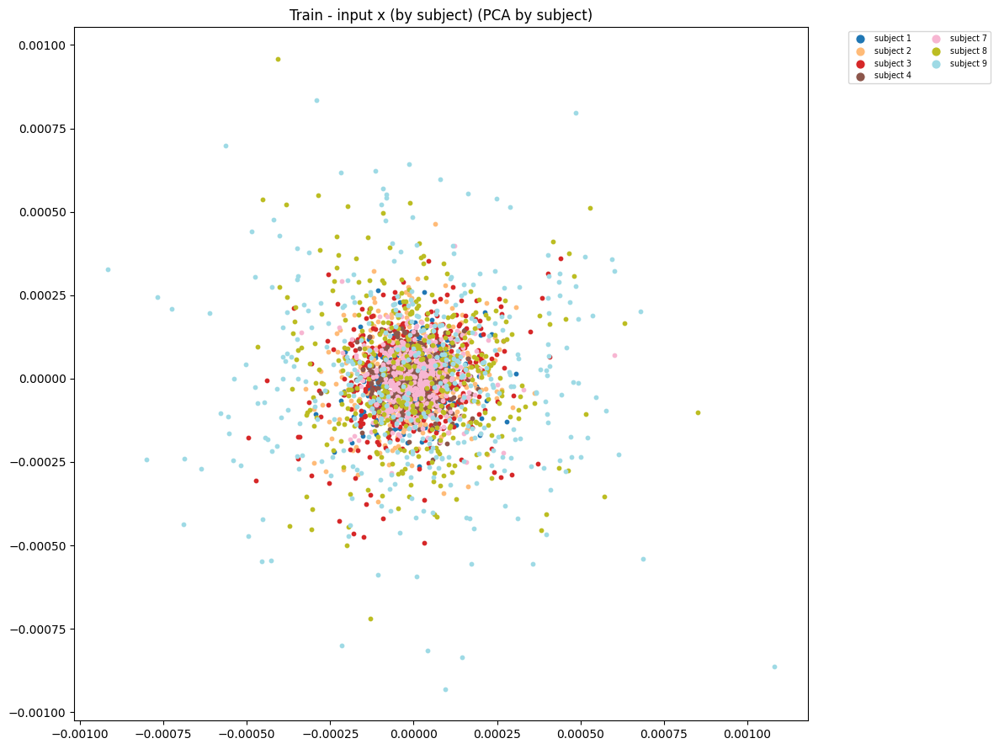

Running t-SNE on 2688 samples...


<ipython-input-56-3c2b76cb6440>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


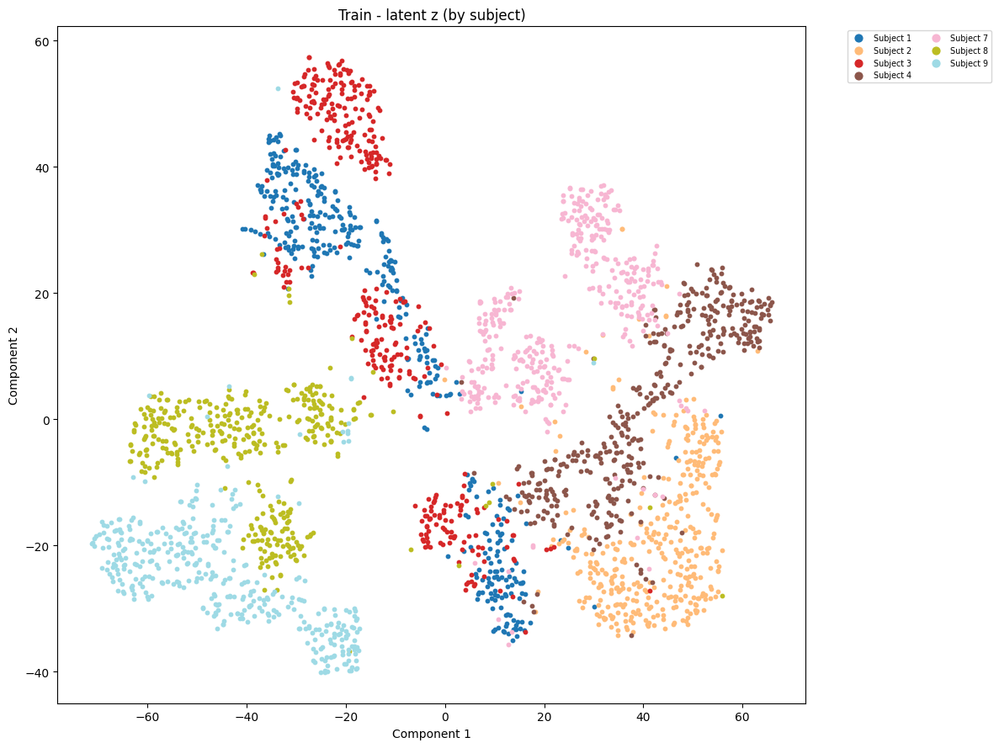

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


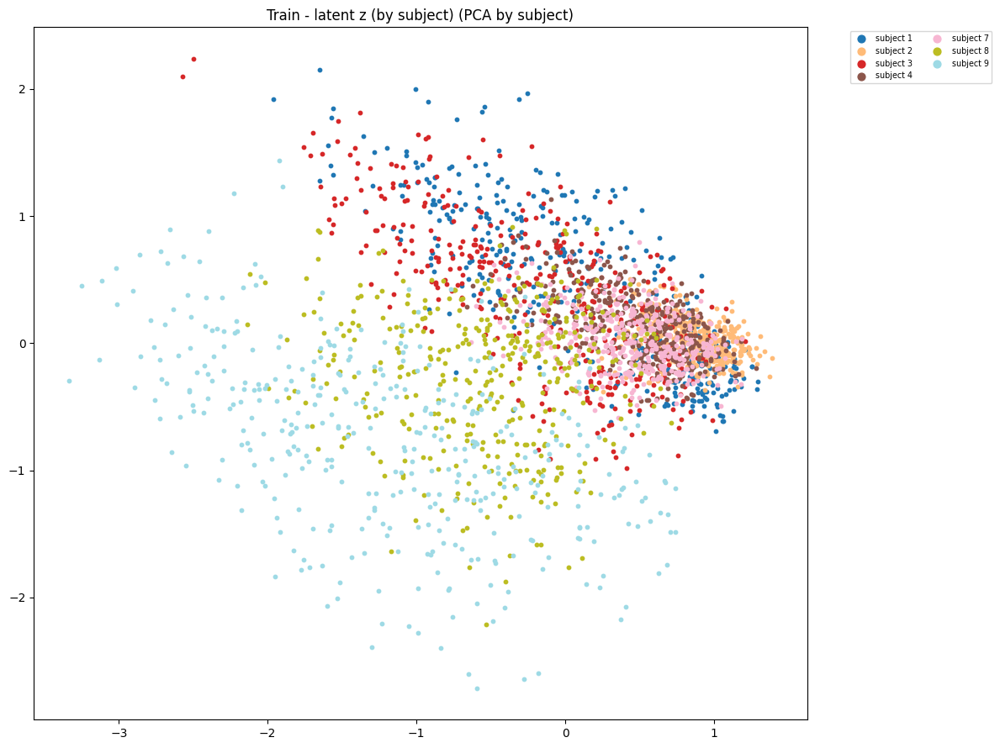

Running t-SNE on 2688 samples...


<ipython-input-56-3c2b76cb6440>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


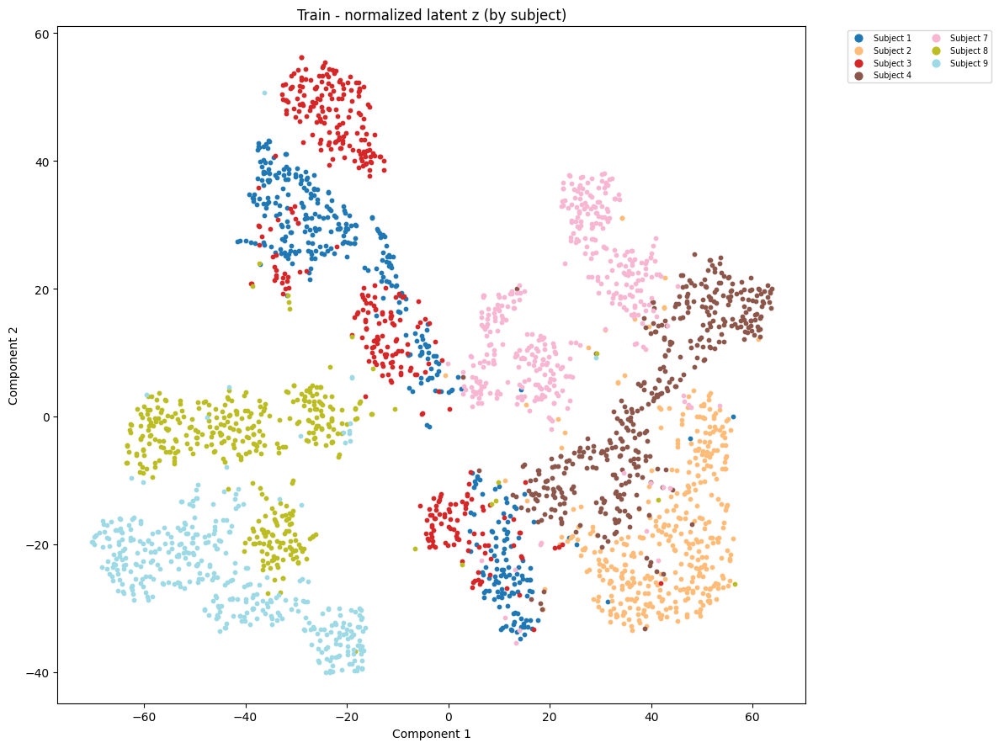

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


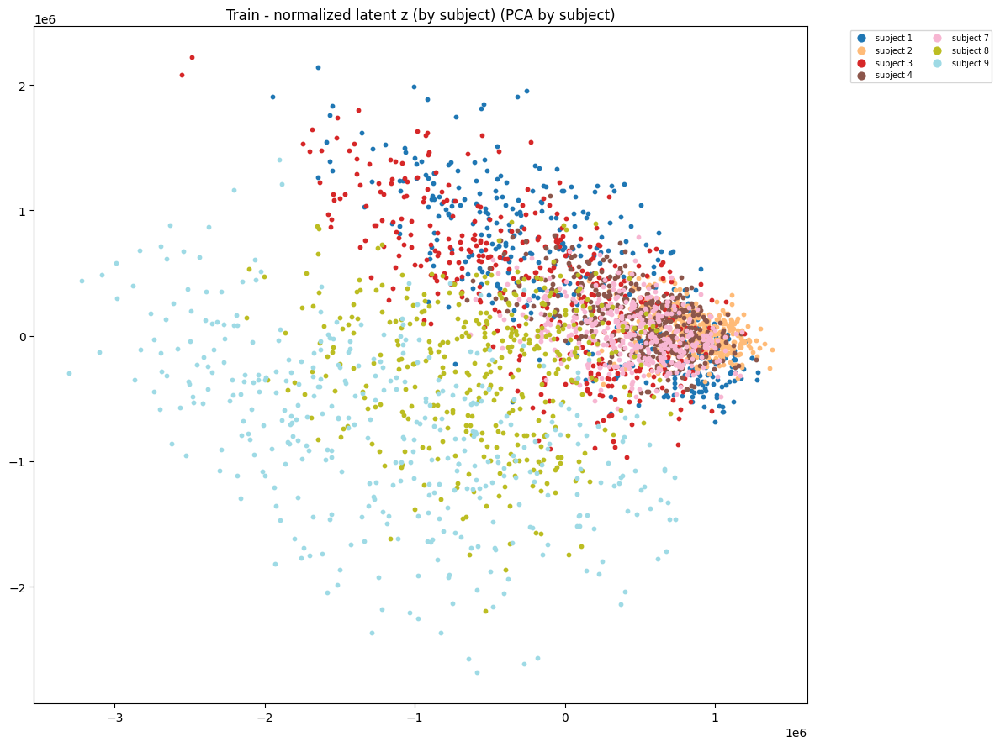

In [ ]:
#train by subject
train_iter = iter(train_loader)

x0, y0, sid0 = next(train_iter)
print(">>> First 30 subject_ids from dataloader (sid):")
print(sid0[:30].tolist())

_, z0 = encoder(x0.to(device))
z_list = [z0.detach().cpu()]
x_list = [x0.view(x0.size(0), -1).detach().cpu()]
sid_list = [sid0.cpu()]
first_30_sid = sid0[:30].tolist()

with torch.no_grad():
    for x, _, sid in train_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list.append(z.detach().cpu())
        x_list.append(x.view(x.size(0), -1).detach().cpu())
        sid_list.append(sid.cpu())

z_all_tensor = torch.cat(z_list, dim=0)
sid_all_tensor = torch.cat(sid_list, dim=0)

z_all_normed = torch.stack([
    (z_all_tensor[i] - z_stats[int(sid_all_tensor[i])][0].squeeze(0).cpu()) /
    z_stats[int(sid_all_tensor[i])][1].squeeze(0).cpu()
    for i in range(z_all_tensor.size(0))
])


z_all = torch.cat(z_list, dim=0).numpy()
x_all = torch.cat(x_list, dim=0).numpy()
sid_all = torch.cat(sid_list, dim=0).numpy()

print(">>> First 30 subject_ids used for t-SNE coloring:")
print(first_30_sid)

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

kmeans = KMeans(n_clusters=33, random_state=42).fit(z_all_val)
print("ARI score:", adjusted_rand_score(sid_all_val, kmeans.labels_))

tsne_visualize_latentz_by_subject(x_all, sid_all, title="Train - input x (by subject)")
pca_and_plot(x_all, sid_all, f"Train - input x (by subject)", color_type='subject')
tsne_visualize_latentz_by_subject(z_all, sid_all, title="Train - latent z (by subject)")
pca_and_plot(z_all, sid_all, f"Train - latent z (by subject)", color_type='subject')

tsne_visualize_latentz_by_subject(z_all_normed, sid_all, title="Train - normalized latent z (by subject)")
pca_and_plot(z_all_normed, sid_all, f"Train - normalized latent z (by subject)", color_type='subject')



In [ ]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all, sid_all)
acc = accuracy_score(sid_all, clf.predict(z_all))
results['linear_probe_subject_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all, sid_all)
knn_acc = accuracy_score(sid_all, knn.predict(z_all))
results['knn_subject_acc'] = knn_acc

kmeans_subject = KMeans(n_clusters=len(np.unique(sid_all)), random_state=0).fit(z_all)
ari_subject = adjusted_rand_score(sid_all, kmeans_subject.labels_)
nmi_subject = normalized_mutual_info_score(sid_all, kmeans_subject.labels_)
results['ARI_subject'] = ari_subject
results['NMI_subject'] = nmi_subject

sil_subject = silhouette_score(z_all, sid_all)
results['silhouette_subject'] = sil_subject

for k, v in results.items():
    print(f"{k}: {v:.4f}")

linear_probe_subject_acc: 0.9580
knn_subject_acc: 0.9528
ARI_subject: 0.2474
NMI_subject: 0.3970
silhouette_subject: 0.0180


>>> First 30 subject_ids from val dataloader (sid):
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7]
>>> First 30 subject_ids used for t-SNE coloring (val):
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7]
>>> First 30 subject_ids from sid_all_val:
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7]
Running t-SNE on 672 samples...


<ipython-input-56-3c2b76cb6440>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


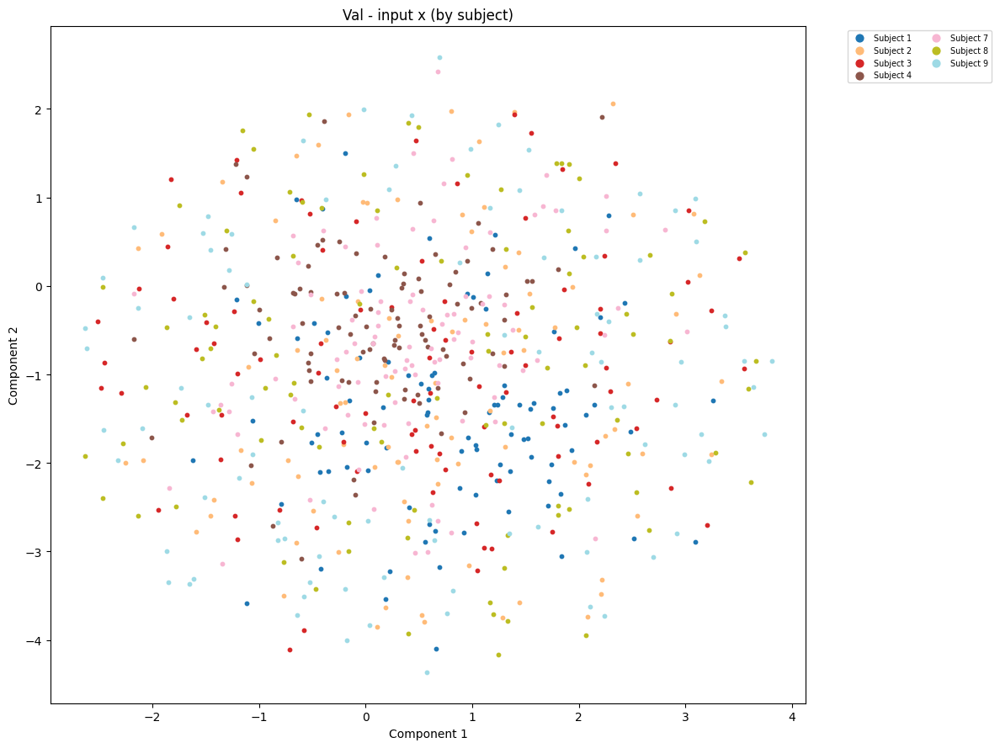

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


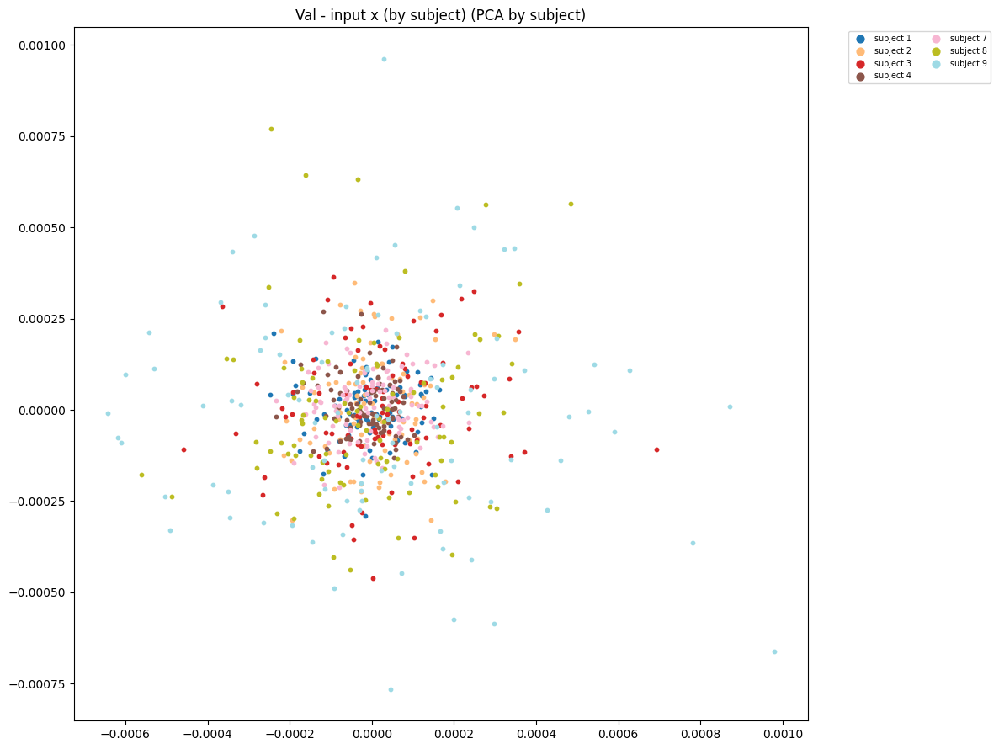

Running t-SNE on 672 samples...


<ipython-input-56-3c2b76cb6440>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


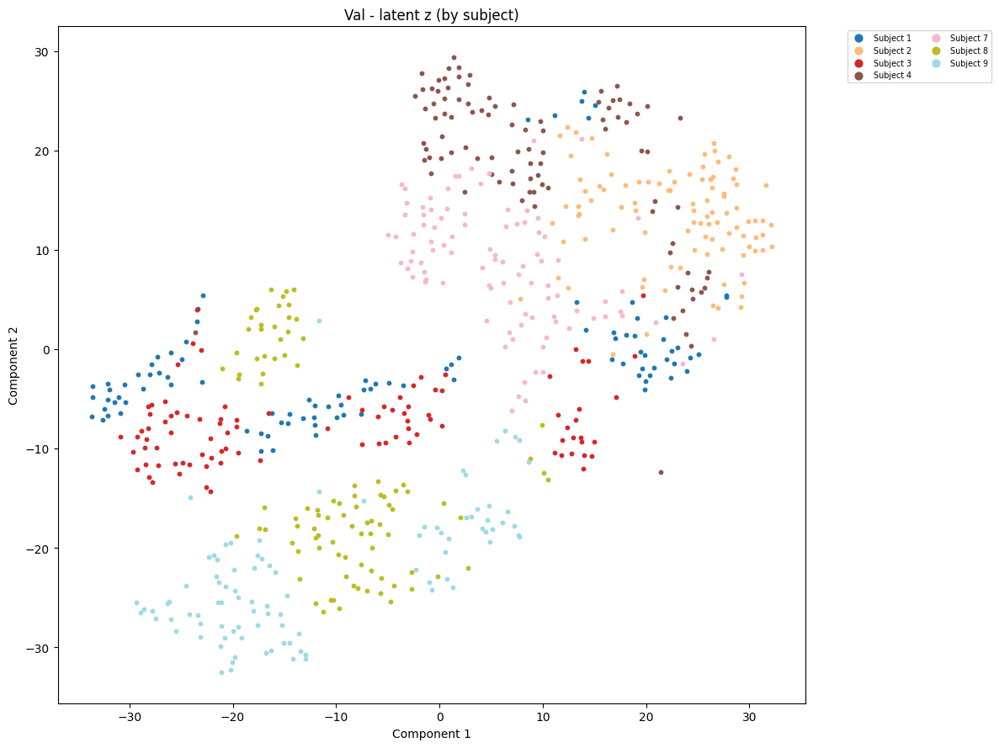

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


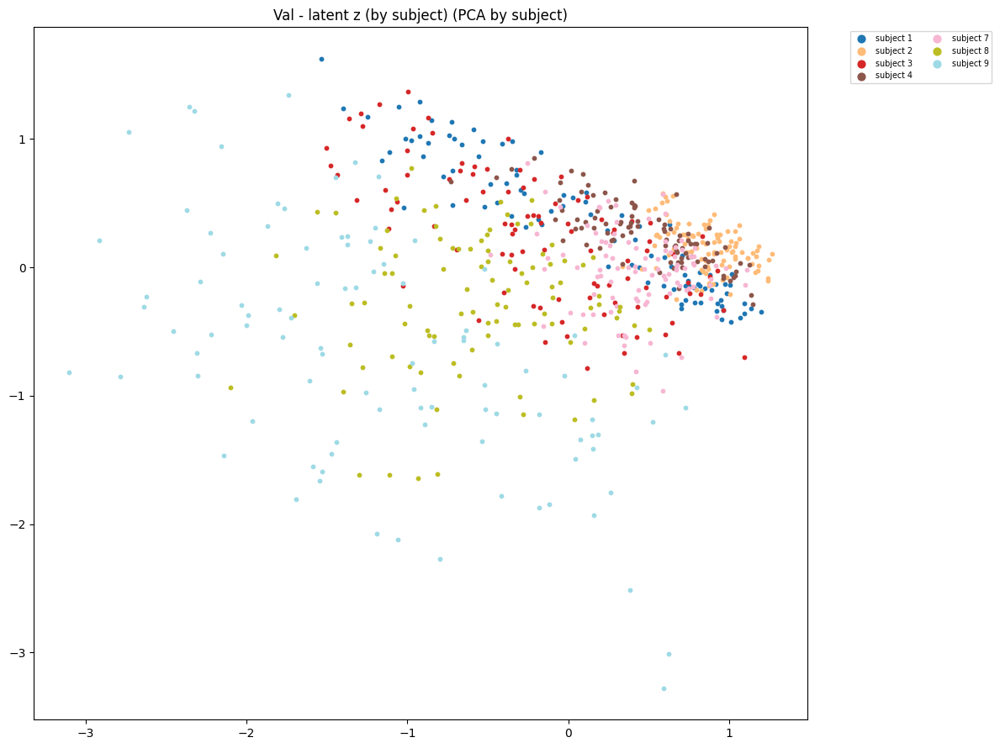

Running t-SNE on 672 samples...


<ipython-input-56-3c2b76cb6440>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


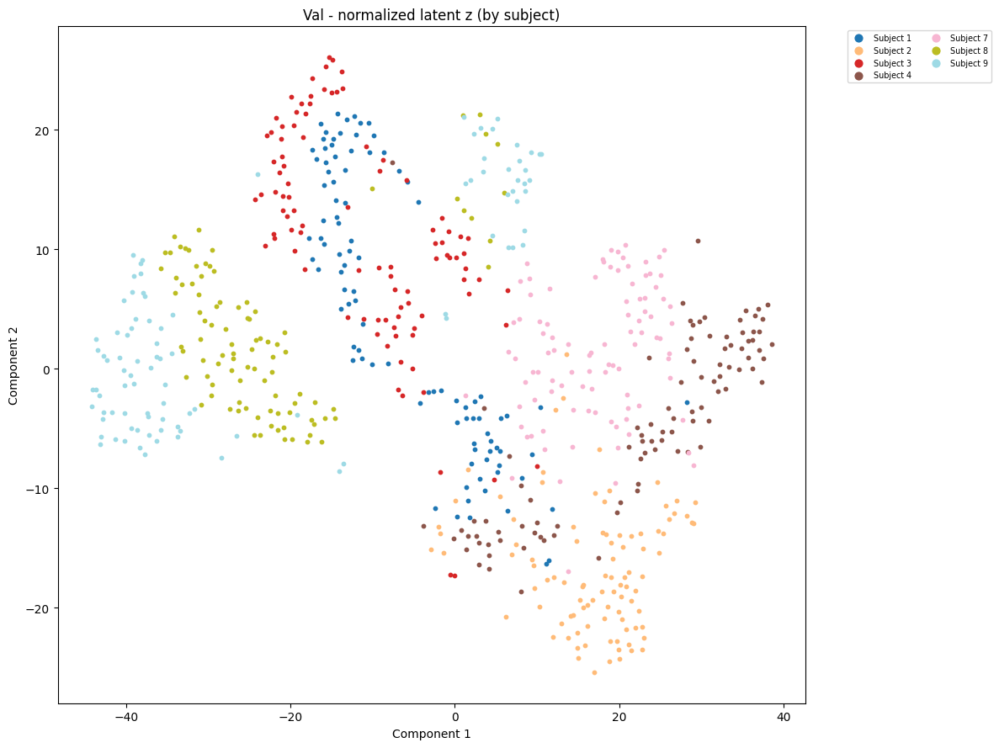

<ipython-input-50-bf21395d0ef5>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


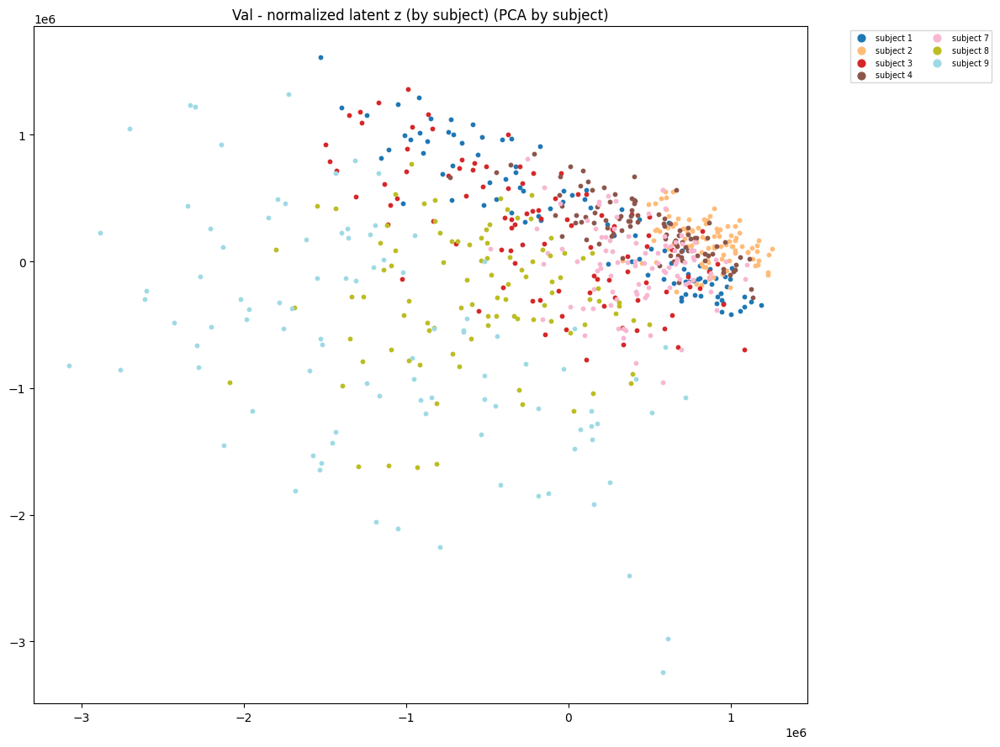

In [ ]:
#val by subject (shuffle = F)
val_iter = iter(val_loader)

x0_val, y0_val, sid0_val = next(val_iter)
print(">>> First 30 subject_ids from val dataloader (sid):")
print(sid0_val[:30].tolist())

_, z0_val = encoder(x0_val.to(device))
z_list_val = [z0_val.detach().cpu()]
x_list_val = [x0_val.view(x0_val.size(0), -1).detach().cpu()]
sid_list_val = [sid0_val.cpu()]
first_30_sid_val = sid0_val[:30].tolist()

with torch.no_grad():
    for x, _, sid in val_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_val.append(z.detach().cpu())
        x_list_val.append(x.view(x.size(0), -1).detach().cpu())
        sid_list_val.append(sid.cpu())

z_all_val_tensor = torch.cat(z_list_val, dim=0)
sid_all_val_tensor = torch.cat(sid_list_val, dim=0)

z_all_val_normed = torch.stack([
    (z_all_val_tensor[i] - z_stats[int(sid_all_val_tensor[i])][0].squeeze(0).cpu()) /
    z_stats[int(sid_all_val_tensor[i])][1].squeeze(0).cpu()
    for i in range(z_all_val_tensor.size(0))
])

z_all_val = torch.cat(z_list_val, dim=0).numpy()
x_all_val = torch.cat(x_list_val, dim=0).numpy()
sid_all_val = torch.cat(sid_list_val, dim=0).numpy()

print(">>> First 30 subject_ids used for t-SNE coloring (val):")
print(first_30_sid_val)
print(">>> First 30 subject_ids from sid_all_val:")
print(sid_all_val[:30].tolist())

tsne_visualize_latentz_by_subject(x_all_val, sid_all_val, title="Val - input x (by subject)")
pca_and_plot(x_all_val, sid_all_val, f"Val - input x (by subject)", color_type='subject')
tsne_visualize_latentz_by_subject(z_all_val, sid_all_val, title="Val - latent z (by subject)")
pca_and_plot(z_all_val, sid_all_val, f"Val - latent z (by subject)", color_type='subject')

tsne_visualize_latentz_by_subject(z_all_val_normed, sid_all_val, title="Val - normalized latent z (by subject)")
pca_and_plot(z_all_val_normed, sid_all_val, f"Val - normalized latent z (by subject)", color_type='subject')



In [ ]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_val, sid_all_val)
acc = accuracy_score(sid_all_val, clf.predict(z_all_val))
results['linear_probe_subject_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_val, sid_all_val)
knn_acc = accuracy_score(sid_all_val, knn.predict(z_all_val))
results['knn_subject_acc'] = knn_acc

kmeans_subject = KMeans(n_clusters=len(np.unique(sid_all_val)), random_state=0).fit(z_all_val)
ari_subject = adjusted_rand_score(sid_all_val, kmeans_subject.labels_)
nmi_subject = normalized_mutual_info_score(sid_all_val, kmeans_subject.labels_)
results['ARI_subject'] = ari_subject
results['NMI_subject'] = nmi_subject

sil_subject = silhouette_score(z_all_val, sid_all_val)
results['silhouette_subject'] = sil_subject

for k, v in results.items():
    print(f"{k}: {v:.4f}")

linear_probe_subject_acc: 0.9137
knn_subject_acc: 0.9167
ARI_subject: 0.2048
NMI_subject: 0.3972
silhouette_subject: 0.0045


In [ ]:
#val2 by subject (shuffle = T)
val_iter = iter(val2_loader)

x0_val, y0_val, sid0_val = next(val_iter)
print(">>> First 30 subject_ids from val dataloader (sid):")
print(sid0_val[:30].tolist())

_, z0_val = encoder(x0_val.to(device))
z_list_val = [z0_val.detach().cpu()]
x_list_val = [x0_val.view(x0_val.size(0), -1).detach().cpu()]
sid_list_val = [sid0_val.cpu()]
first_30_sid_val = sid0_val[:30].tolist()

with torch.no_grad():
    for x, _, sid in val_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_val.append(z.detach().cpu())
        x_list_val.append(x.view(x.size(0), -1).detach().cpu())
        sid_list_val.append(sid.cpu())

z_all_val = torch.cat(z_list_val, dim=0).numpy()
x_all_val = torch.cat(x_list_val, dim=0).numpy()
sid_all_val = torch.cat(sid_list_val, dim=0).numpy()

print(">>> First 30 subject_ids used for t-SNE coloring (val):")
print(first_30_sid_val)
print(">>> First 30 subject_ids from sid_all_val:")
print(sid_all_val[:30].tolist())

tsne_visualize_latentz_by_subject(x_all_val, sid_all_val, title="Val - input x (by subject)")
pca_and_plot(x_all_val, sid_all_val, f"Val - input x (by subject)", color_type='subject')
tsne_visualize_latentz_by_subject(z_all_val, sid_all_val, title="Val - latent z (by subject)")
pca_and_plot(z_all_val, sid_all_val, f"Val - latent z (by subject)", color_type='subject')


NameError: name 'val2_loader' is not defined

In [ ]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_val, sid_all_val)
acc = accuracy_score(sid_all_val, clf.predict(z_all_val))
results['linear_probe_subject_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_val, sid_all_val)
knn_acc = accuracy_score(sid_all_val, knn.predict(z_all_val))
results['knn_subject_acc'] = knn_acc

kmeans_subject = KMeans(n_clusters=len(np.unique(sid_all_val)), random_state=0).fit(z_all_val)
ari_subject = adjusted_rand_score(sid_all_val, kmeans_subject.labels_)
nmi_subject = normalized_mutual_info_score(sid_all_val, kmeans_subject.labels_)
results['ARI_subject'] = ari_subject
results['NMI_subject'] = nmi_subject

sil_subject = silhouette_score(z_all_val, sid_all_val)
results['silhouette_subject'] = sil_subject

for k, v in results.items():
    print(f"{k}: {v:.4f}")

| Metric                  | Train-Label | Val-Label (shuffle=F) | Val2-Label (shuffle=T) | Train-Subject | Val-Subject (shuffle=F) | Val2-Subject (shuffle=T) | Reference Meaning                                                | Good if ↑ |
|-------------------------|-------------|------------------------|-------------------------|----------------|--------------------------|---------------------------|-------------------------------------------------------------------|------------|
| Linear Probe Accuracy   | 0.5402      | 0.5979                 | 0.6900                  | 0.2832         | 0.8042                   | 0.4417                    | Accuracy of logistic regression on latent `z`                    | ↑          |
| KNN Accuracy (k=5)      | 0.4983      | 0.3508                 | 0.4895                  | 0.2584         | 0.7517                   | 0.2366                    | Accuracy of 5-NN classifier on latent `z`                        | ↑          |
| ARI                     | 0.0076      | 0.0143                 | 0.0141                  | -0.0000        | 0.0142                   | -0.0006                   | Adjusted Rand Index between true labels and cluster assignments | ↑          |
| NMI                     | 0.1251      | 0.1792                 | 0.2155                  | 0.0544         | 0.3616                   | 0.1600                    | Normalized Mutual Information between true and cluster labels    | ↑          |
| Silhouette Score        | -0.1957     | -0.2082                | -0.1973                 | -0.1286        | -0.0161                  | -0.1486                   | How well-separated the embeddings are by ground truth labels     | ↑          |


### original wrong return label method (static)

In [ ]:
#used only for tsne plot
class EEGDataset(Dataset):
    "Characterizes a dataset for PyTorch"

    def __init__(self, X, Y, transform=None):
        "Initialization"
        self.X = X
        self.Y = Y
        self.transform = transform

    def __len__(self):
        "Denotes the total number of samples"
        return len(self.X)

    def __getitem__(self, index):
        "Generates one sample of data"
        # Load data and get label
        x = self.X[index]
        y = self.Y[index]
        if self.transform:
            x = self.transform(x)
        return x.squeeze(), y

def load_split_dataset(root_dir, num_seen, seed=43):
    random.seed(seed)

    all_subjects = list(range(1, 36))
    seen_subjects = random.sample(all_subjects, num_seen)#25 seen
    unseen_subjects = [sid for sid in all_subjects if sid not in seen_subjects]#10 unseen

    split_cfg = {
        "train":  [(sid, [0, 1, 2, 3]) for sid in seen_subjects],
        "val":    [(sid, [4]) for sid in seen_subjects],
        "test1":  [(sid, [5]) for sid in seen_subjects],
        "test2":  [(sid, [0, 1, 2, 3, 4, 5]) for sid in unseen_subjects]
    }

    print(f"[Split] Seen subjects (train/val/test1): {seen_subjects}")
    print(f"[Split] Unseen subjects (test2): {unseen_subjects}")

    loaders = {}
    subject_id_dict = {}  # 临时存 subject_id list

    for split, sid_sess in split_cfg.items():
        X_all, Y_all = [], []
        subject_ids = []
        for sid, sess in sid_sess:
            X, Y = load_data_by_session(root_dir, sid, sess)
            X_all.append(X)
            Y_all.append(Y)
            subject_ids.extend([sid] * len(Y))
        X_all = torch.cat(X_all, dim=0)
        Y_all = torch.cat(Y_all, dim=0)
        dataset = EEGDataset(X_all, Y_all)
        loaders[split] = DataLoader(dataset, batch_size=32, shuffle=(split == "train"))
        subject_id_dict[split] = torch.tensor(subject_ids, dtype=torch.long)

    # return subject_id list for t-SNE
    for split in ["train", "val"]:
        if split in subject_id_dict:
            loaders[f"{split}_subjects"] = subject_id_dict[split]
    return loaders


In [ ]:
subject_chars_dir = '/content/drive/MyDrive/project/dataset/ssvep/chars' # Where to store all character data
subject_ids = list(range(1, 36)) #35 samples + 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 32
batch_size2 = 260
seed = 44
shuffle = True

# load all subjects' data
loaders = load_split_dataset(subject_chars_dir, num_seen=33, seed=seed)
train_loader = loaders["train"]
val_loader = loaders["val"]
test1_loader = loaders["test1"]
test2_loader = loaders["test2"]


In [ ]:
loaders["train_subjects"]

print(">>> First 10 subject_ids from static subject_ids:")
print(loaders["train_subjects"][:30].tolist())

print(">>> First 10 subject_ids corresponding to z from dataloader (mismatched):")
with torch.no_grad():
    for i, (x, y) in enumerate(loaders["train"]):
        print(f"x.shape: {x.shape}")
        break


In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def visualize_tsne(encoder, dataloader, device):
    encoder.eval()
    features = []
    labels = []

    with torch.no_grad():
        for x, y in dataloader:
            x, y = x.to(device), y.to(device)
            _, z = encoder(x)
            features.append(z.cpu())
            labels.append(y.cpu())

    X = torch.cat(features, dim=0).numpy()
    y = torch.cat(labels, dim=0).numpy()

    print("Running t-SNE...")
    X_emb = TSNE(n_components=2, perplexity=30, learning_rate=200).fit_transform(X)

    n_classes = len(np.unique(y))
    cmap = cm.get_cmap('tab20', n_classes)

    plt.figure(figsize=(12, 9))
    for i in range(n_classes):
        idx = (y == i)
        color = cmap(i / n_classes)
        plt.scatter(X_emb[idx, 0], X_emb[idx, 1], label=f"Label {i}", color=color, s=10)

    plt.legend(markerscale=2, fontsize="small", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title("t-SNE visualization of latent z (colored by label)")
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.tight_layout()
    plt.show()

In [ ]:
visualize_tsne(diffe.encoder, train_loader, device)
visualize_tsne(diffe.encoder, val_loader, device)

In [ ]:
import matplotlib.cm as cm

def visualize_tsne_subject_temp(encoder, dataloader, subject_ids, device, title="t-SNE"):
    encoder.eval()
    features = []

    with torch.no_grad():
        for x, y in dataloader:
            x = x.to(device)
            _, z = encoder(x)
            features.append(z.cpu())

    X = torch.cat(features, dim=0).numpy()
    subjects = subject_ids.numpy()

    print("Running t-SNE...")
    X_emb = TSNE(n_components=2, perplexity=30, learning_rate=200).fit_transform(X)

    unique_subjects = sorted(np.unique(subjects))
    n_subjects = len(unique_subjects)
    colormap = cm.get_cmap('tab20', n_subjects)

    plt.figure(figsize=(12, 9))
    for i, sid in enumerate(unique_subjects):
        idx = (subjects == sid)
        color = colormap(i / n_subjects)
        plt.scatter(X_emb[idx, 0], X_emb[idx, 1], label=f"Subject {sid}", color=color, s=8)

    plt.legend(markerscale=2, fontsize="x-small", bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
    plt.title(f"{title} (colored by subject)")
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.tight_layout()
    plt.show()


In [ ]:
visualize_tsne_subject_temp(encoder, loaders["train"], loaders["train_subjects"], device, title="Train Set")
visualize_tsne_subject_temp(encoder, loaders["val"], loaders["val_subjects"], device, title="Val Set")